## Requirements and Imports


In [1]:
import copy
import os
from pathlib import Path
from itertools import combinations
from scipy import stats
import models
import metrics
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import scanpy as sc
from torch.utils.data import TensorDataset, DataLoader , WeightedRandomSampler

from sklearn.metrics import roc_auc_score , pairwise_distances
import torch
import torch.optim as optim
epoch_num=50
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
import scipy.sparse as sp
from numba import jit
import squidpy as sq
from sklearn.preprocessing import normalize
from scipy import stats

In [2]:
SMALL_SIZE = 14
MEDIUM_SIZE = 18
BIGGER_SIZE = 20
sc.set_figure_params(scanpy=True, fontsize=16)
plt.rc('font', size=MEDIUM_SIZE)          # controls default text sizes
plt.rc('axes', titlesize=MEDIUM_SIZE)     # fontsize of the axes title
plt.rc('axes', labelsize=MEDIUM_SIZE)    # fontsize of the x and y labels
plt.rc('xtick', labelsize=MEDIUM_SIZE)    # fontsize of the tick labels
plt.rc('ytick', labelsize=MEDIUM_SIZE)    # fontsize of the tick labels
plt.rc('legend', fontsize=MEDIUM_SIZE)    # legend fontsize
plt.rc('figure', titlesize=BIGGER_SIZE)  # fontsize of the figure title


https://www.nature.com/articles/s41588-019-0489-5

In [3]:
gene_names = pd.read_csv("./emt/GSE114687_pseudospace_genes.tsv.gz", sep='\t', header=None)
obs_names = pd.read_csv("./emt/GSE114687_pseudospace_barcodes.tsv.gz", sep='\t', header=None)
meta_data = pd.read_csv("./emt/GSE114687_pseudospace_metadata.tsv.gz", sep='\t', header=None)


In [4]:
obs_names_df = []
for i in meta_data[0]:
    obs_names_df.append(i[:16])
meta_data['obs_names']=obs_names_df
meta_data

,0,1,2,3,4,5,6,7,obs_names
0,AAACATACGAATAG-1_Mock_TGFB_agregated_samples,7875,Mock_inner,2.446514,7.850946,NaN,Mock,inner,AAACATACGAATAG-1
1,AAACATACGCTAAC-1_Mock_TGFB_agregated_samples,9293,Mock_inner,18.897634,-30.413764,NaN,Mock,inner,AAACATACGCTAAC-1
2,AAACATACGGACAG-1_Mock_TGFB_agregated_samples,12336,Mock_inner,22.660482,-15.233417,NaN,Mock,inner,AAACATACGGACAG-1
3,AAACATTGTCTCAT-1_Mock_TGFB_agregated_samples,13649,Mock_inner,33.711906,3.374066,NaN,Mock,inner,AAACATTGTCTCAT-1
4,AAACCGTGTCACGA-1_Mock_TGFB_agregated_samples,5157,Mock_inner,5.977838,3.041868,NaN,Mock,inner,AAACCGTGTCACGA-1
...,...,...,...,...,...,...,...,...,...
9263,TTTCTACTGGGCAA-4_Mock_TGFB_agregated_samples,13900,TGFB_outer,-27.424128,-18.095953,NaN,TGFB,outer,TTTCTACTGGGCAA-4
9264,TTTGACTGAGCCTA-4_Mock_TGFB_agregated_samples,6026,TGFB_outer,-7.266742,-6.151832,NaN,TGFB,outer,TTTGACTGAGCCTA-4
9265,TTTGACTGGACGTT-4_Mock_TGFB_agregated_samples,4378,TGFB_outer,-3.583475,10.264568,NaN,TGFB,outer,TTTGACTGGACGTT-4
9266,TTTGCATGAAGTAG-4_Mock_TGFB_agregated_samples,9569,TGFB_outer,-22.550981,-23.891142,NaN,TGFB,outer,TTTGCATGAAGTAG-4


In [5]:
adata = sc.read_mtx("emt/GSE114687_pseudospace_matrix.mtx.gz")
adata = adata.T
adata

AnnData object with n_obs × n_vars = 23951 × 32738

In [6]:
adata.var_names=gene_names[1]

adata.obs_names=obs_names[0]
adata

AnnData object with n_obs × n_vars = 23951 × 32738

In [7]:
valid_obs_names = [x for x in meta_data['obs_names'] if x in adata.obs_names]
bdata = adata[valid_obs_names]
not_valid_index = []
for index, row in meta_data.iterrows():
    if row['obs_names'] not in valid_obs_names:
        not_valid_index.append(index)


In [8]:
meta_data= meta_data.drop(not_valid_index)

bdata.obs['spatial_id']= list(meta_data[7])

bdata.obs['treatment_id']= list(meta_data[6])

bdata.obs['cell_line'] = 'MCF10A'

treatment_and_cell_line = bdata.obs['cell_line'] + '_' + bdata.obs['treatment_id']
bdata.obs['treatment_and_cell_line'] = treatment_and_cell_line

/var/folders/yk/yt973zks3y50tkwcqhndwqrm0000gn/T/ipykernel_39223/246053062.py:3: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  bdata.obs['spatial_id']= list(meta_data[7])
/Users/jonathankarin/.conda/envs/spctral_jan/lib/python3.9/site-packages/anndata/_core/anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


In [9]:
gene_names_2 = pd.read_csv("./emt/GSE114687_HuMEC_genes.tsv.gz", sep='\t', header=None)
obs_names_2 = pd.read_csv("./emt/GSE114687_HuMEC_barcodes.tsv.gz", sep='\t', header=None)
meta_data_2 = pd.read_csv("./emt/GSE114687_HuMEC_pseudospace_metadata.tsv.gz", sep='\t')

In [10]:
adata_2 = sc.read_mtx("emt/GSE114687_HuMEC_matrix.mtx.gz")
adata_2 = adata_2.T
adata_2

AnnData object with n_obs × n_vars = 22352 × 32738

In [11]:
adata_2.var_names=gene_names_2[1]

adata_2.obs_names=obs_names_2[0]

adata_2.obs['spatial_id']= list(meta_data_2['spatial_id'])

adata_2.obs['treatment_id']= list(meta_data_2['treatment_id'])


adata_2.obs['cell_line']='HuMEC'


treatment_and_cell_line = adata_2.obs['cell_line'] + '_' + adata_2.obs['treatment_id']
adata_2.obs['treatment_and_cell_line'] = treatment_and_cell_line

adata_2

AnnData object with n_obs × n_vars = 22352 × 32738
    obs: 'spatial_id', 'treatment_id', 'cell_line', 'treatment_and_cell_line'

In [12]:
adata_2.var_names_make_unique()
bdata.var_names_make_unique()

In [13]:
adata = bdata.concatenate(adata_2)
ddata = adata.copy()

/Users/jonathankarin/.conda/envs/spctral_jan/lib/python3.9/site-packages/anndata/_core/anndata.py:1785: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  [AnnData(sparse.csr_matrix(a.shape), obs=a.obs) for a in all_adatas],


In [14]:
sc.pp.filter_cells(adata, min_genes=200)
sc.pp.filter_genes(adata, min_cells=3)
adata

AnnData object with n_obs × n_vars = 31590 × 20538
    obs: 'spatial_id', 'treatment_id', 'cell_line', 'treatment_and_cell_line', 'batch', 'n_genes'
    var: 'n_cells'

In [15]:
adata.var_names_make_unique()

In [16]:
adata.var['mt'] = adata.var_names.str.startswith('MT-')  # annotate the group of mitochondrial genes as 'mt'
sc.pp.calculate_qc_metrics(adata, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)


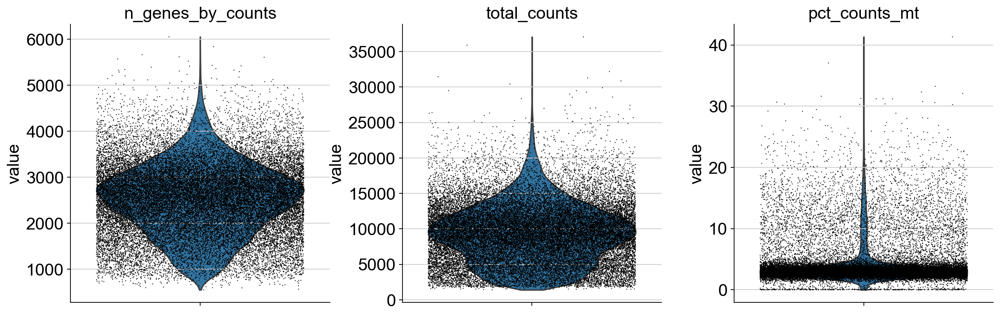

In [17]:
sc.pl.violin(adata, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'],
             jitter=0.4, multi_panel=True)


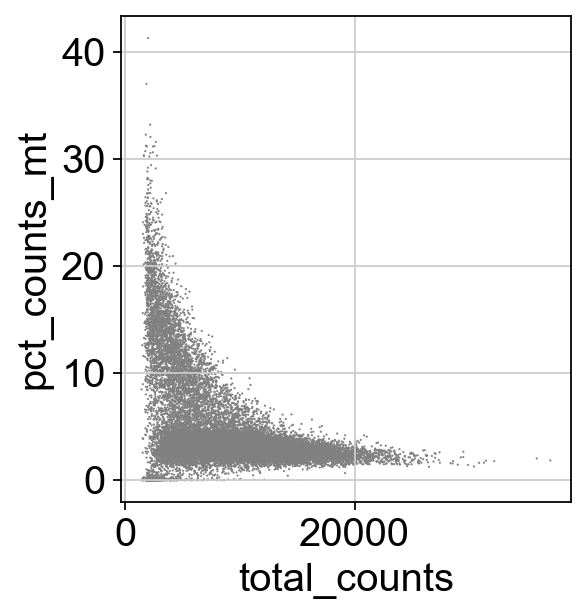

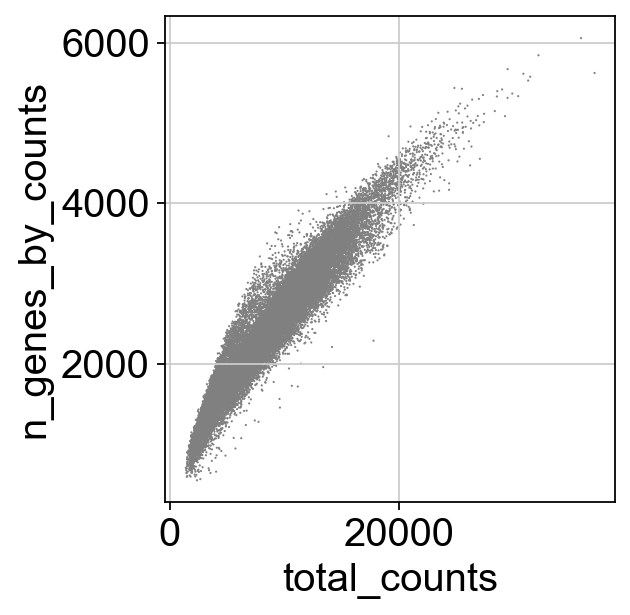

In [18]:
sc.pl.scatter(adata, x='total_counts', y='pct_counts_mt')
sc.pl.scatter(adata, x='total_counts', y='n_genes_by_counts')


In [19]:
adata = adata[adata.obs.n_genes_by_counts < 4000, :]
adata = adata[adata.obs.pct_counts_mt < 5, :]
adata

View of AnnData object with n_obs × n_vars = 25806 × 20538
    obs: 'spatial_id', 'treatment_id', 'cell_line', 'treatment_and_cell_line', 'batch', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt'
    var: 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'

In [20]:
sc.pp.highly_variable_genes(adata, n_top_genes=3000, flavor='seurat_v3')

/Users/jonathankarin/.conda/envs/spctral_jan/lib/python3.9/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


In [21]:
orig_adata1 = adata.copy()
adata = adata[:,adata.var['highly_variable']]
adata

View of AnnData object with n_obs × n_vars = 25806 × 3000
    obs: 'spatial_id', 'treatment_id', 'cell_line', 'treatment_and_cell_line', 'batch', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt'
    var: 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm'
    uns: 'hvg'

In [22]:
sc.pp.normalize_per_cell(adata, counts_per_cell_after=1e4)
sc.pp.log1p(adata)
#sc.pp.filter_genes_dispersion(adata,n_top_genes=3000)


/Users/jonathankarin/.conda/envs/spctral_jan/lib/python3.9/site-packages/scanpy/preprocessing/_simple.py:524: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs[key_n_counts] = counts_per_cell


OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


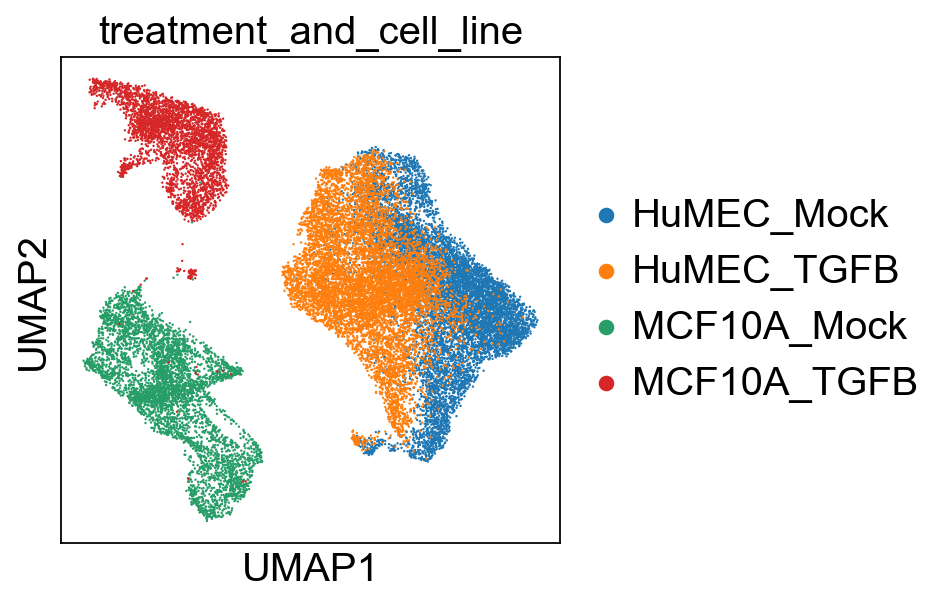

In [23]:
sc.pp.pca(adata)
sc.pp.neighbors(adata)
sc.tl.umap(adata)
sc.pl.umap(adata,color=['treatment_and_cell_line'])

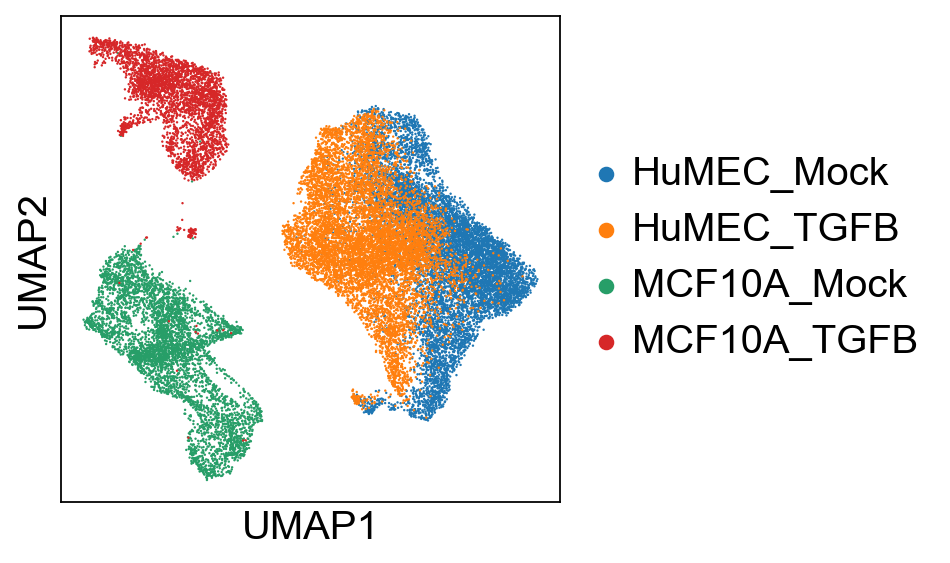

In [24]:
sc.pl.umap(adata,color=['treatment_and_cell_line'], title='')

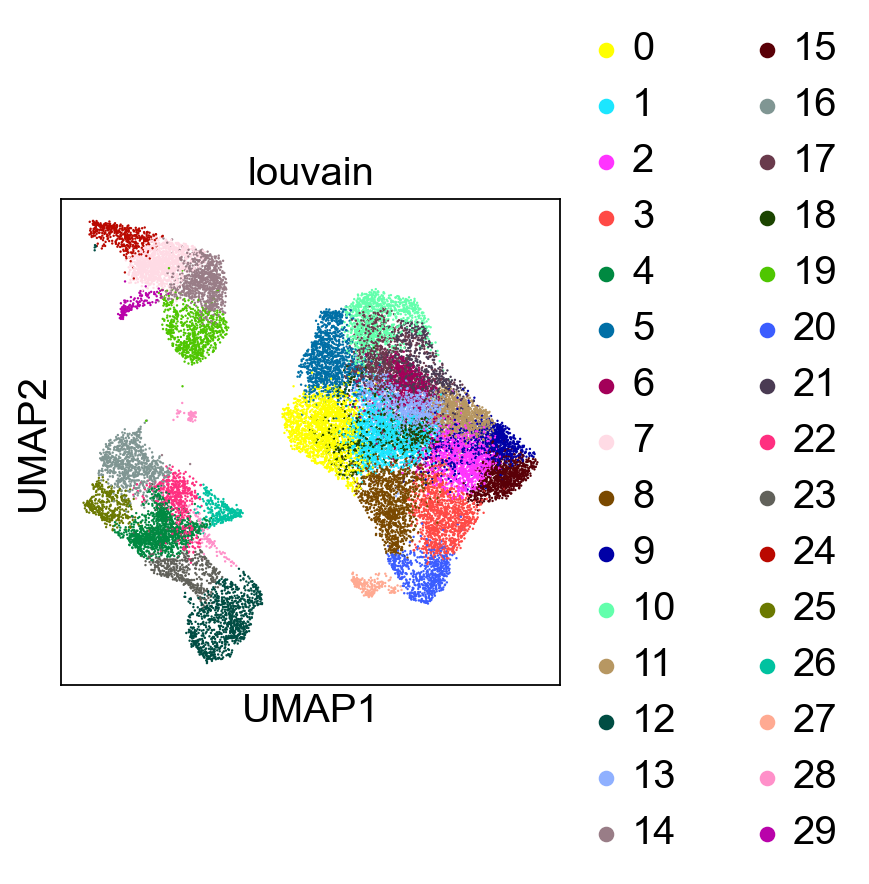

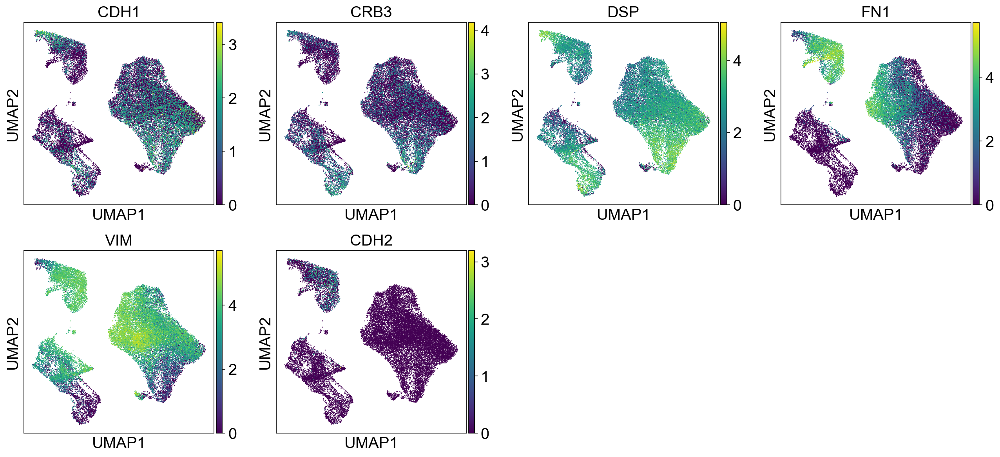

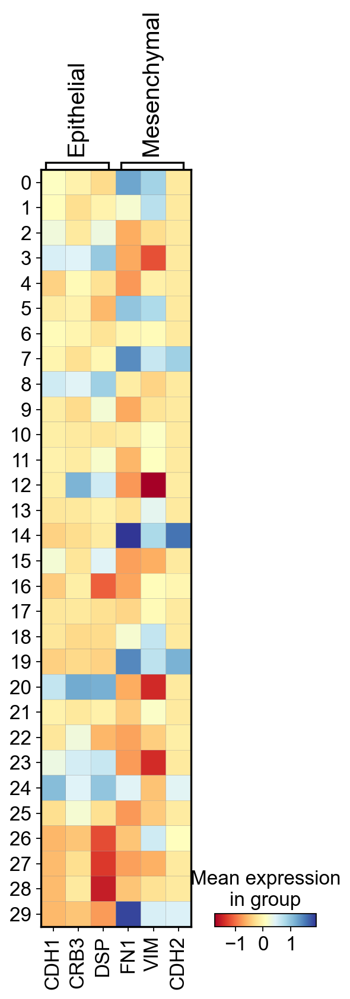

In [25]:

marker_genes_dict = {
    'Epithelial': ['CDH1','CRB3','DSP'],
    'Mesenchymal': ['FN1','VIM','CDH2']
}

marker_gene_list = ['CDH1', 'CRB3', 'DSP','FN1','VIM','CDH2']
sc.tl.louvain(adata, resolution=2.5)
sc.pl.umap(adata, color='louvain')
sc.pl.umap(adata, color=marker_gene_list)
bdata = adata.copy()
sc.pp.scale(bdata)
sc.pl.matrixplot(bdata,groupby='louvain', var_names= marker_genes_dict,cmap='RdYlBu')

In [26]:
cell_type_mapping ={}
for i in (adata.obs['louvain'].unique()):
    adata_tmp = bdata[bdata.obs['louvain'].isin([i])]
    epi = ((np.mean(adata_tmp[:,'DSP'].X)))
    mes = (np.mean(adata_tmp[:,'VIM'].X))
    if epi >mes:
        cell_type_mapping[i]='Epithelial'
    else:
        cell_type_mapping[i]='Mesenchymal'


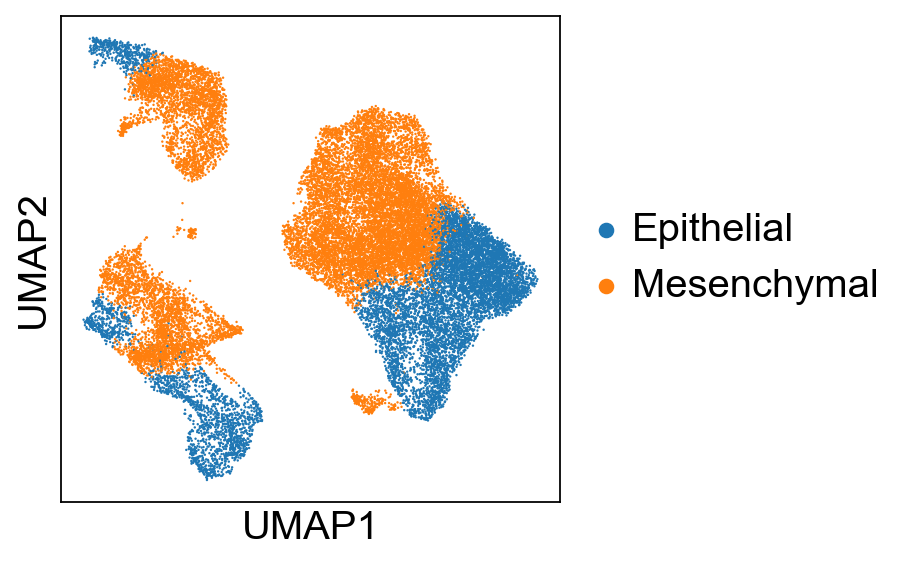

In [27]:

cell_type_list = []

# Iterate over each cluster and assign the corresponding cell type
for i in range(adata.n_obs):
    cluster_name = adata.obs['louvain'][i]
    if cluster_name in cell_type_mapping:
        cell_type_list.append(cell_type_mapping[cluster_name])
    else:
        cell_type_list.append(cluster_name)

# Update the cell type column in the AnnData object
adata.obs['CellType'] = np.array(cell_type_list)
sc.pl.umap(adata, color=['CellType'], title='')


In [28]:
epoch_num=30
prob_list = models.follow_training_dyn_neural_net(adata, label_key='CellType',iterNum=epoch_num, device=device, batch_size=128)

/Users/jonathankarin/PycharmProjects/training_dyn/models.py:51: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  output = F.log_softmax(x)


[1,     2] loss: 0.140
[1,    12] loss: 0.676
[1,    22] loss: 0.618
[1,    32] loss: 0.556
[1,    42] loss: 0.481
[1,    52] loss: 0.423
[1,    62] loss: 0.347
[1,    72] loss: 0.336
[1,    82] loss: 0.302
[1,    92] loss: 0.299
[1,   102] loss: 0.285
[1,   112] loss: 0.267
[1,   122] loss: 0.235
[1,   132] loss: 0.222
[1,   142] loss: 0.247
[1,   152] loss: 0.241
[1,   162] loss: 0.238
[1,   172] loss: 0.213
[1,   182] loss: 0.231
[1,   192] loss: 0.207
[1,   202] loss: 0.243
[2,     2] loss: 0.041
[2,    12] loss: 0.193
[2,    22] loss: 0.242
[2,    32] loss: 0.199
[2,    42] loss: 0.211
[2,    52] loss: 0.222
[2,    62] loss: 0.208
[2,    72] loss: 0.178
[2,    82] loss: 0.197
[2,    92] loss: 0.191
[2,   102] loss: 0.180
[2,   112] loss: 0.176
[2,   122] loss: 0.202
[2,   132] loss: 0.197
[2,   142] loss: 0.175
[2,   152] loss: 0.180
[2,   162] loss: 0.184
[2,   172] loss: 0.187
[2,   182] loss: 0.168
[2,   192] loss: 0.171
[2,   202] loss: 0.178
[3,     2] loss: 0.030
[3,    12] 

[17,   142] loss: 0.056
[17,   152] loss: 0.050
[17,   162] loss: 0.062
[17,   172] loss: 0.060
[17,   182] loss: 0.049
[17,   192] loss: 0.068
[17,   202] loss: 0.065
[18,     2] loss: 0.012
[18,    12] loss: 0.058
[18,    22] loss: 0.053
[18,    32] loss: 0.052
[18,    42] loss: 0.058
[18,    52] loss: 0.070
[18,    62] loss: 0.061
[18,    72] loss: 0.060
[18,    82] loss: 0.043
[18,    92] loss: 0.053
[18,   102] loss: 0.059
[18,   112] loss: 0.055
[18,   122] loss: 0.046
[18,   132] loss: 0.051
[18,   142] loss: 0.045
[18,   152] loss: 0.052
[18,   162] loss: 0.047
[18,   172] loss: 0.046
[18,   182] loss: 0.046
[18,   192] loss: 0.043
[18,   202] loss: 0.061
[19,     2] loss: 0.011
[19,    12] loss: 0.058
[19,    22] loss: 0.038
[19,    32] loss: 0.054
[19,    42] loss: 0.055
[19,    52] loss: 0.053
[19,    62] loss: 0.039
[19,    72] loss: 0.054
[19,    82] loss: 0.057
[19,    92] loss: 0.059
[19,   102] loss: 0.057
[19,   112] loss: 0.041
[19,   122] loss: 0.045
[19,   132] loss

In [29]:
all_conf , all_var = models.probability_list_to_confidence_and_var(prob_list, n_obs= adata.n_obs, epoch_num=epoch_num)

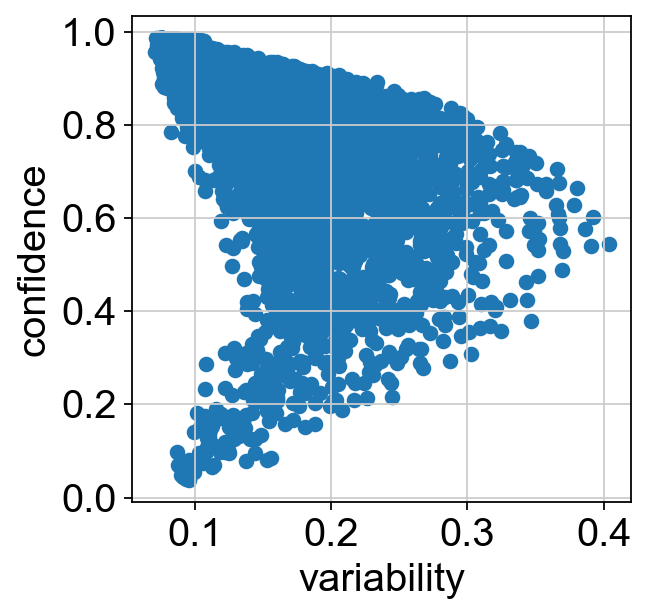

In [30]:
plt.scatter( all_var.detach().numpy(),all_conf.detach().numpy())
plt.xlabel('variability')
plt.ylabel('confidence')
plt.show()

In [31]:
adata.obs["var"] = list(all_var.detach().numpy())
adata.obs["conf"] = list(all_conf.detach().numpy())


In [32]:
adata.obs['Confidence']= adata.obs['conf']
adata.obs['Variability']= adata.obs['var']
adata.obs['Treatment']= adata.obs['treatment_id']


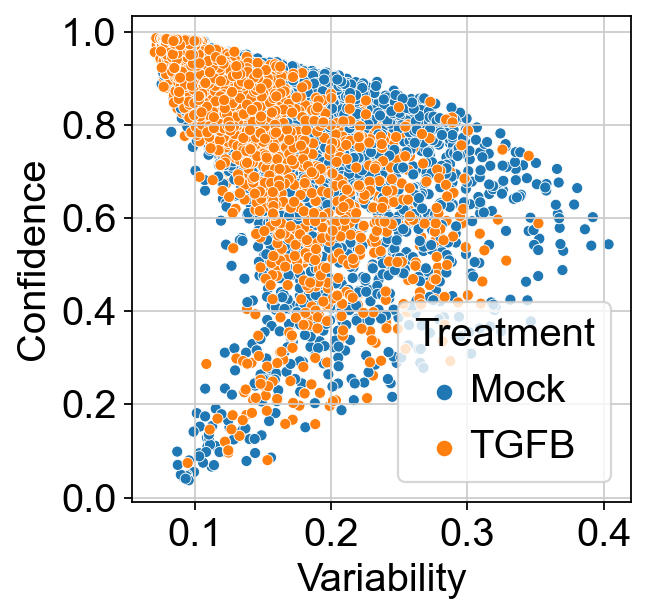

In [33]:
fig = sns.scatterplot(data=adata.obs, x="Variability", y="Confidence",hue='Treatment',s=25)
plt.show(fig)

In [34]:
conf, var = models.find_cutoff_paramter(adata,'CellType', device=device, probability=0.05,percentile=90, epoch_num=epoch_num)

/Users/jonathankarin/PycharmProjects/training_dyn/models.py:51: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  output = F.log_softmax(x)


[1,     2] loss: 0.139
[1,    12] loss: 0.674
[1,    22] loss: 0.624
[1,    32] loss: 0.564
[1,    42] loss: 0.513
[1,    52] loss: 0.475
[1,    62] loss: 0.452
[1,    72] loss: 0.408
[1,    82] loss: 0.405
[1,    92] loss: 0.385
[2,     2] loss: 0.073
[2,    12] loss: 0.383
[2,    22] loss: 0.390
[2,    32] loss: 0.371
[2,    42] loss: 0.363
[2,    52] loss: 0.361
[2,    62] loss: 0.360
[2,    72] loss: 0.360
[2,    82] loss: 0.349
[2,    92] loss: 0.337
[3,     2] loss: 0.064
[3,    12] loss: 0.349
[3,    22] loss: 0.364
[3,    32] loss: 0.360
[3,    42] loss: 0.374
[3,    52] loss: 0.345
[3,    62] loss: 0.354
[3,    72] loss: 0.348
[3,    82] loss: 0.353
[3,    92] loss: 0.340
[4,     2] loss: 0.067
[4,    12] loss: 0.345
[4,    22] loss: 0.330
[4,    32] loss: 0.329
[4,    42] loss: 0.342
[4,    52] loss: 0.322
[4,    62] loss: 0.348
[4,    72] loss: 0.348
[4,    82] loss: 0.324
[4,    92] loss: 0.323
[5,     2] loss: 0.068
[5,    12] loss: 0.332
[5,    22] loss: 0.319
[5,    32] 

In [35]:
conf, var

(0.45719899535179137, 0.10492941439151766)

/Users/jonathankarin/.conda/envs/spctral_jan/lib/python3.9/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


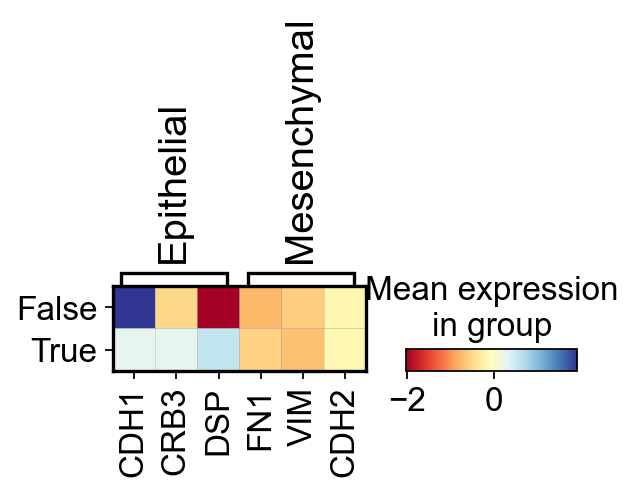

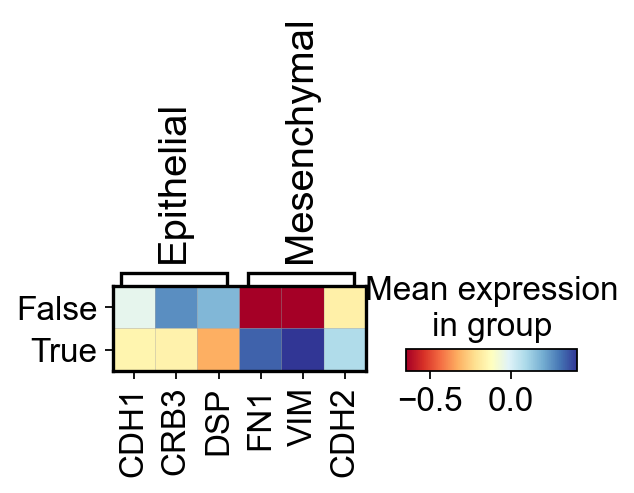

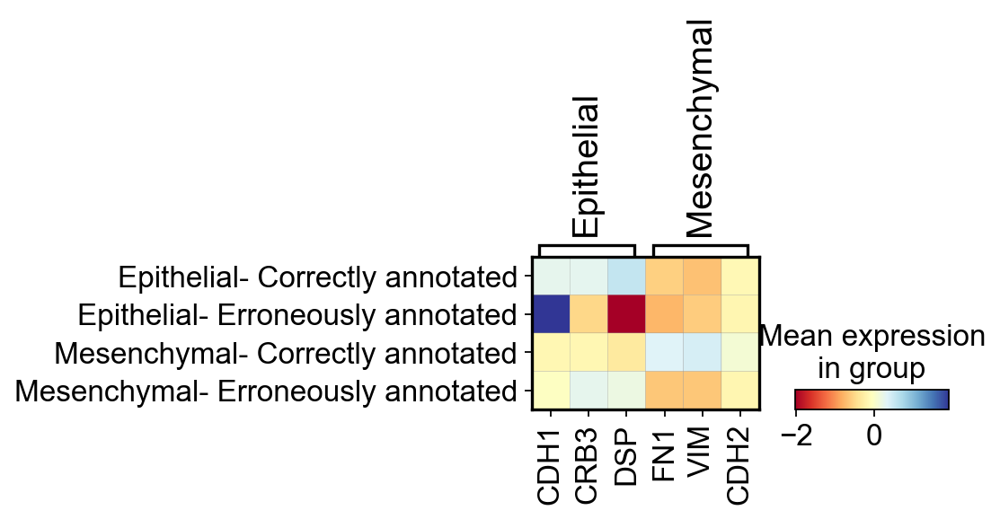

In [36]:
adata.obs['conf_binaries'] = pd.Categorical((adata.obs['conf'] > conf) |  (adata.obs['var'] > var))
bdata= adata.copy()
sc.pp.scale(bdata)
bdata_epi= bdata[bdata.obs['CellType'].isin(['Epithelial'])]
bdata_mes= bdata[bdata.obs['CellType'].isin(['Mesenchymal'])]


sc.pl.matrixplot(bdata_epi,groupby='conf_binaries', var_names= marker_genes_dict,cmap='RdYlBu')
sc.pl.matrixplot(bdata_mes,groupby='conf_binaries', var_names= marker_genes_dict,cmap='RdYlBu')

corr_classified_list =[]
for i in range(bdata.n_obs):
    if bdata.obs['CellType'][i]=='Epithelial':
        if bdata.obs['conf_binaries'][i]==True:
            corr_classified_list.append('Epithelial- Correctly annotated')
        else:
            corr_classified_list.append('Epithelial- Erroneously annotated')
    else:
        if bdata.obs['conf_binaries'][i]==True:
            corr_classified_list.append('Mesenchymal- Correctly annotated')
        else:
            corr_classified_list.append('Mesenchymal- Erroneously annotated')

bdata.obs['cor_annotation']=corr_classified_list

ax = sc.pl.matrixplot(bdata, var_names= marker_genes_dict, groupby='cor_annotation',cmap='RdYlBu')


In [37]:
adata.obs['conf_binaries'].value_counts()

True     25790
False       16
Name: conf_binaries, dtype: int64

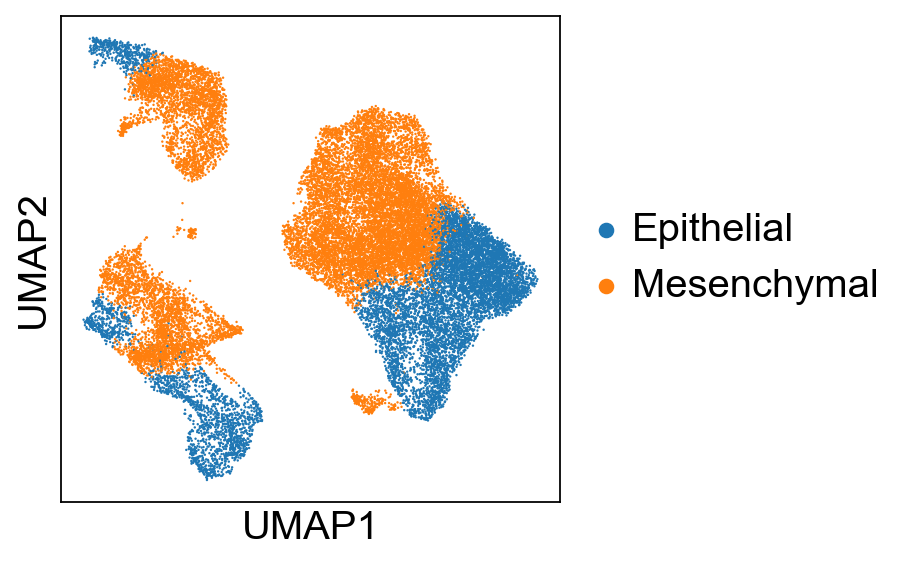

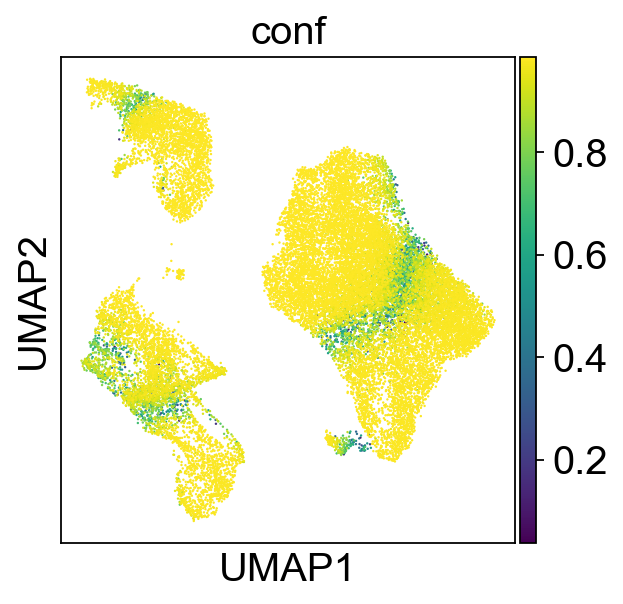

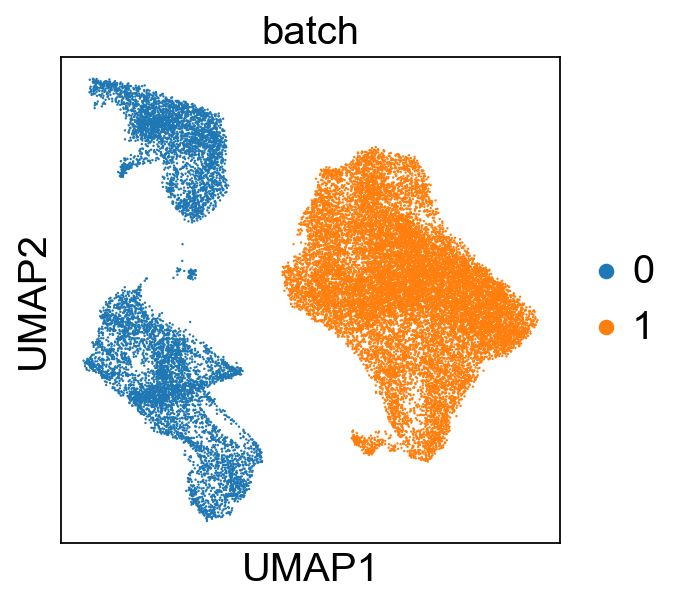

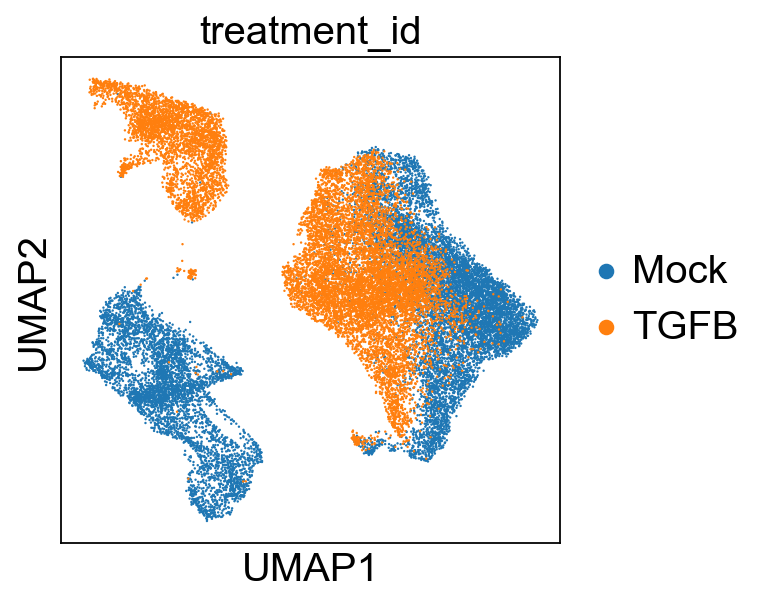

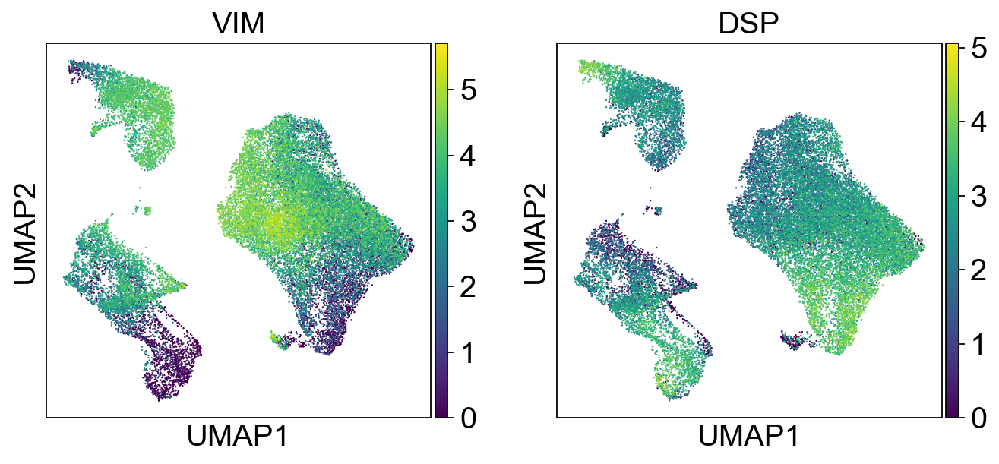

In [38]:
sc.pl.umap(adata,color=["CellType"], title='')
sc.pl.umap(adata,color=['conf'], title='Confidence')
sc.pl.umap(adata,color=['batch'])
sc.pl.umap(adata,color=['treatment_id'])
sc.pl.umap(adata,color=["VIM",'DSP'])

In [39]:
orig_adata = adata.copy()
adata= adata[adata.obs['conf_binaries'].isin([True])]

In [40]:
adata_epi= adata[adata.obs['CellType'].isin(['Epithelial'])]
adata_mes= adata[adata.obs['CellType'].isin(['Mesenchymal'])]



In [41]:
arr1_mes = np.array(adata_mes.obs['conf']).argsort()


In [42]:
arr1_epi = np.array(adata_epi.obs['conf']).argsort()


CDH1


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


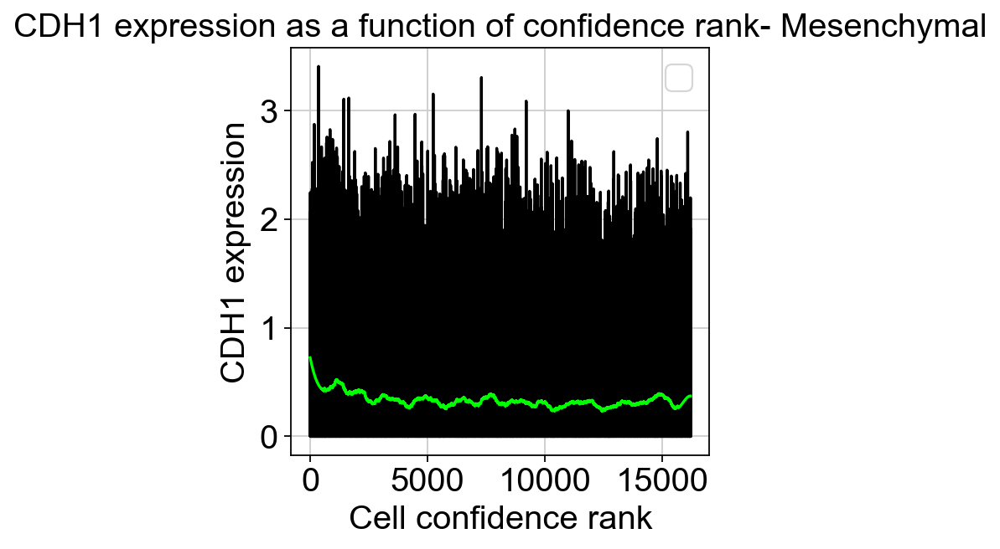

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


SpearmanrResult(correlation=-0.049765715349208, pvalue=2.3133808397414573e-10)
CRB3


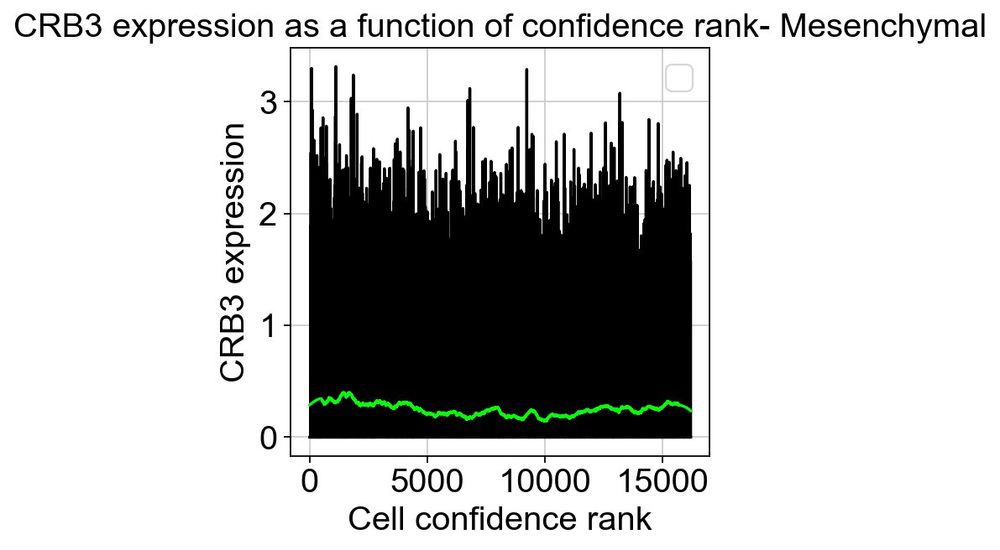

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


SpearmanrResult(correlation=-0.029878659813151513, pvalue=0.00014220002746375175)
DSP


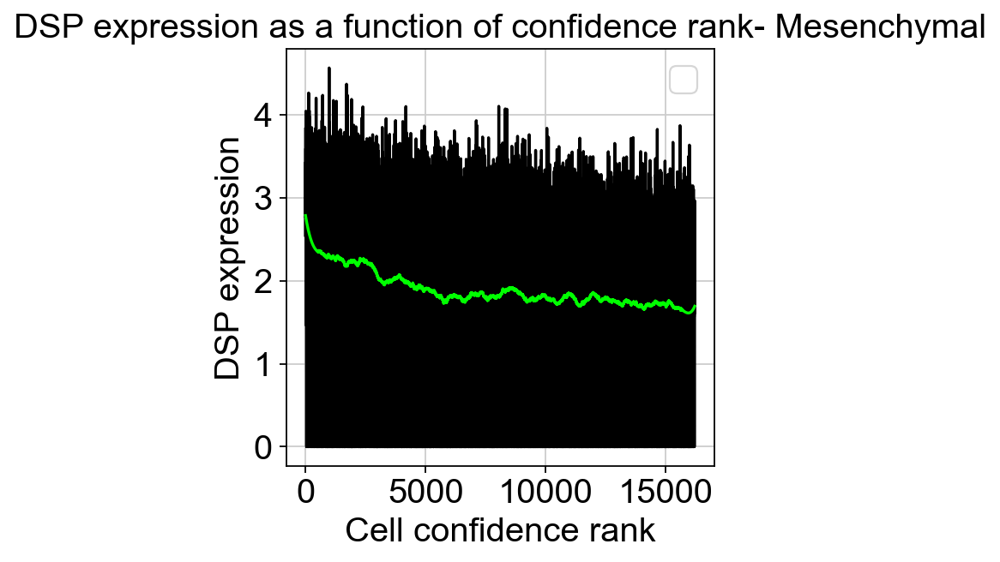

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


SpearmanrResult(correlation=-0.226526418272198, pvalue=1.1903514002202867e-187)
FN1


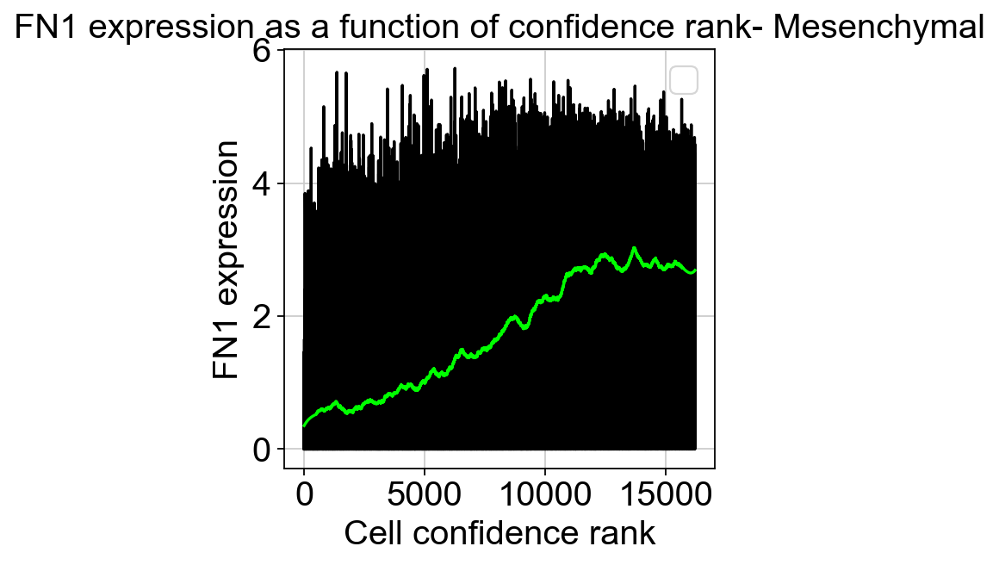

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


SpearmanrResult(correlation=0.5004411202798478, pvalue=0.0)
VIM


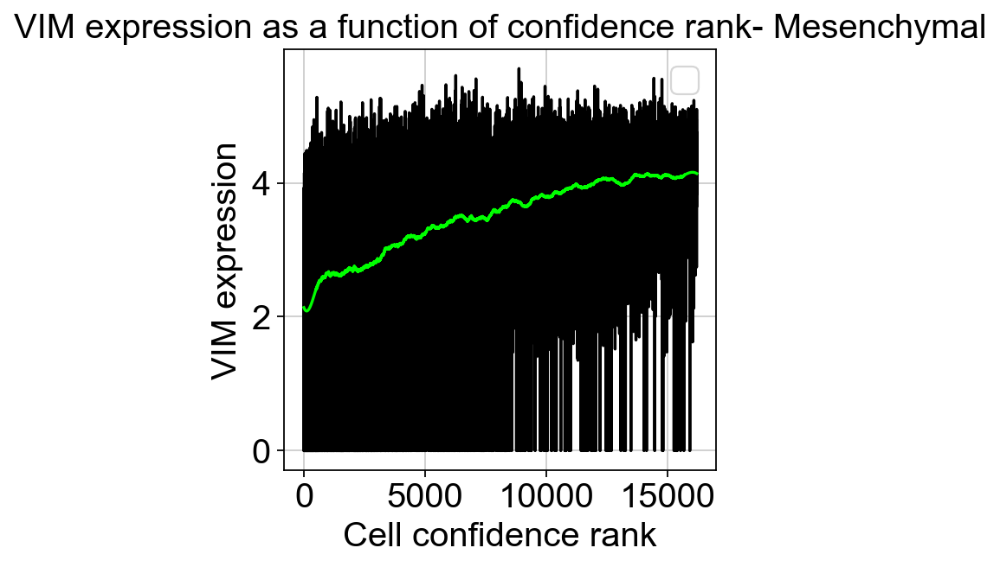

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


SpearmanrResult(correlation=0.47730306425896685, pvalue=0.0)
CDH2


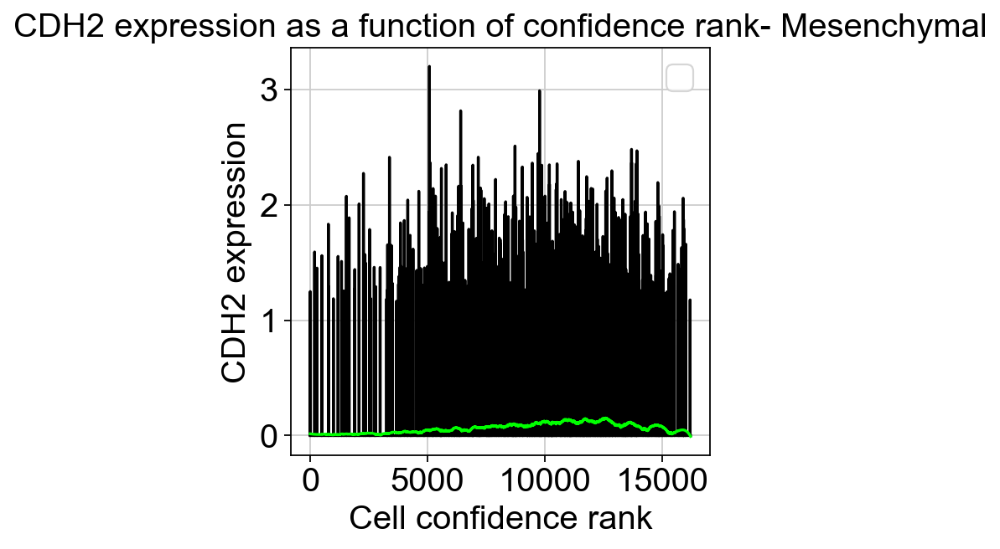

SpearmanrResult(correlation=0.09126118440138531, pvalue=2.5332600380607184e-31)


In [43]:
from scipy.signal import savgol_filter

for i in marker_gene_list:
    print(i)
    plt.plot( range(adata_mes.n_obs),  adata_mes[arr1_mes,i].X.toarray() , color='black')#, s=0.01 )

    plt.plot( range(adata_mes.n_obs),  savgol_filter(adata_mes[arr1_mes,i].X.toarray()[:,0],1001,3) , color='lime')#, s=0.01 )
    plt.xlabel("Cell confidence rank")
    plt.ylabel(str(i) +" expression")
    plt.title(str(i) +" expression as a function of confidence rank- Mesenchymal")
    plt.legend()
    plt.show()
    print(stats.spearmanr(adata_mes.obs['conf'], adata_mes[:,i].X.toarray()))


In [44]:
from scipy.signal import savgol_filter


epi_genes= ['CDH1', 'CRB3', 'DSP']
mes_genes =['FN1', 'VIM', 'CDH2']
mes_vector = np.zeros(adata_mes.n_obs)
epi_vector = np.zeros(adata_mes.n_obs)
for i in mes_genes:
    mes_vector+=adata_mes[:,i].X.toarray()[:,0]
for i in epi_genes:
    epi_vector+=adata_mes[:,i].X.toarray()[:,0]
    
print(stats.spearmanr(adata_mes.obs['conf'], mes_vector/3))
print(stats.spearmanr(adata_mes.obs['conf'], epi_vector/3))


SpearmanrResult(correlation=0.5551773107352709, pvalue=0.0)
SpearmanrResult(correlation=-0.1823930694449576, pvalue=3.025187354396663e-121)


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


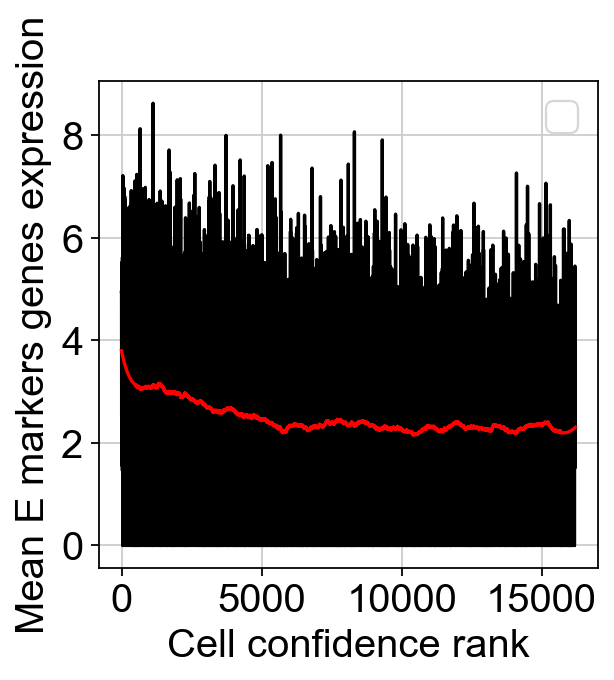

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


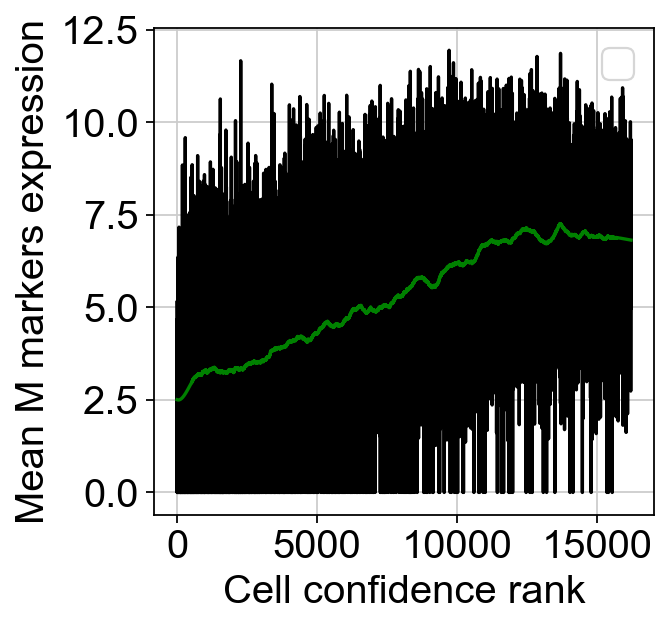

In [45]:
plt.plot( range(adata_mes.n_obs),  epi_vector[arr1_mes]
         , color='black')#, s=0.01 )
plt.plot( range(adata_mes.n_obs),  savgol_filter(epi_vector[arr1_mes],1001,3) , color='r')#, s=0.01 )
plt.xlabel("Cell confidence rank")
plt.ylabel("Mean E markers genes expression")
#plt.title("Mean marker genes expression as a function of confidence rank- Mesenchymal")
plt.legend()
plt.show()

plt.plot( range(adata_mes.n_obs),  mes_vector[arr1_mes]
         , color='black')#, s=0.01 )
plt.plot( range(adata_mes.n_obs),  savgol_filter(mes_vector[arr1_mes],1001,3) , color='g')#, s=0.01 )
plt.xlabel("Cell confidence rank")
plt.ylabel("Mean M markers expression")
#plt.title("Mean marker genes expression expression as a function of confidence rank- Mesenchymal")
plt.legend()
plt.show()



In [46]:
from scipy.signal import savgol_filter


epi_genes= ['CDH1', 'CRB3', 'DSP']
mes_genes =['FN1', 'VIM', 'CDH2']
mes_vector = np.zeros(adata_epi.n_obs)
epi_vector = np.zeros(adata_epi.n_obs)
for i in mes_genes:
    mes_vector+=adata_epi[:,i].X.toarray()[:,0]
for i in epi_genes:
    epi_vector+=adata_epi[:,i].X.toarray()[:,0]
    
print(stats.spearmanr(adata_epi.obs['conf'], mes_vector/3))
print(stats.spearmanr(adata_epi.obs['conf'], epi_vector/3))


SpearmanrResult(correlation=-0.4410899052305406, pvalue=0.0)
SpearmanrResult(correlation=0.40214422776590997, pvalue=0.0)


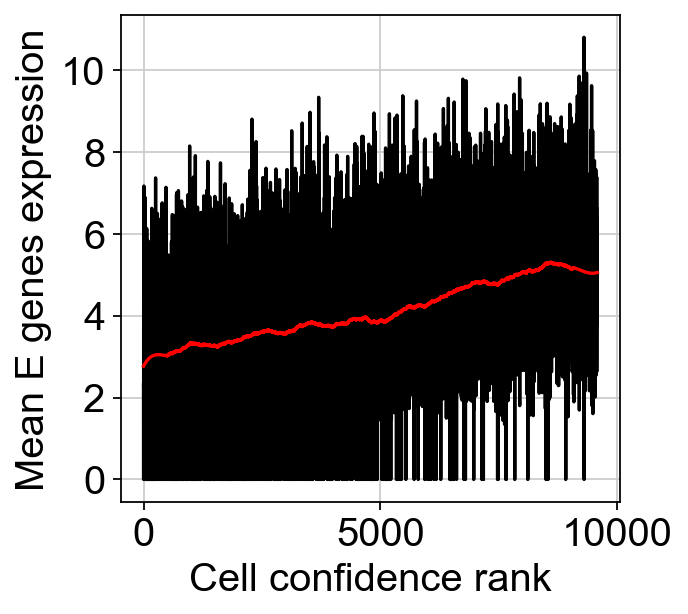

In [47]:
plt.plot( range(adata_epi.n_obs),  epi_vector[arr1_epi]
         , color='black')#, s=0.01 )
plt.plot( range(adata_epi.n_obs),  savgol_filter(epi_vector[arr1_epi],1001,3) , color='r')#, s=0.01 )
plt.ylabel("Mean E genes expression")
plt.xlabel("Cell confidence rank")
plt.show()

Text(0, 0.5, 'Mean M markers genes expression')

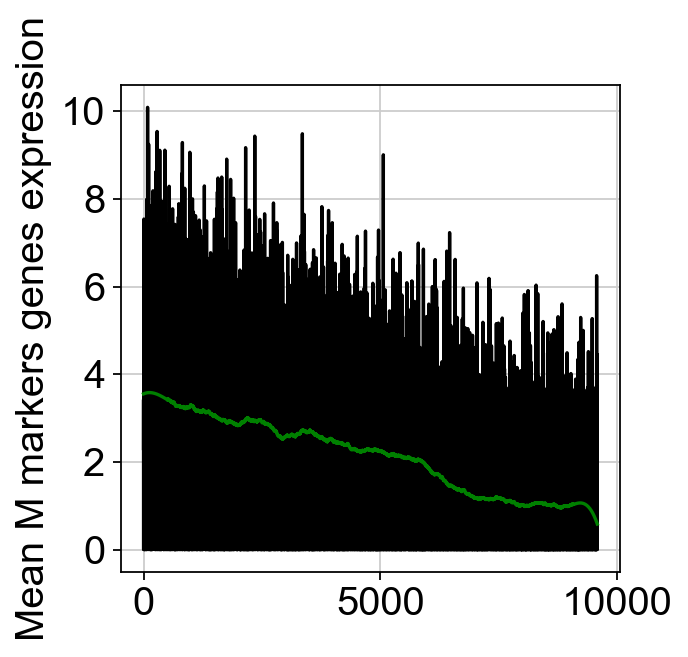

In [48]:
plt.plot( range(adata_epi.n_obs),  mes_vector[arr1_epi]
         , color='black')#, s=0.01 )
plt.plot( range(adata_epi.n_obs),  savgol_filter(mes_vector[arr1_epi],1001,3) , color='g')#, s=0.01 )
plt.ylabel("Mean M markers genes expression")


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


CDH1


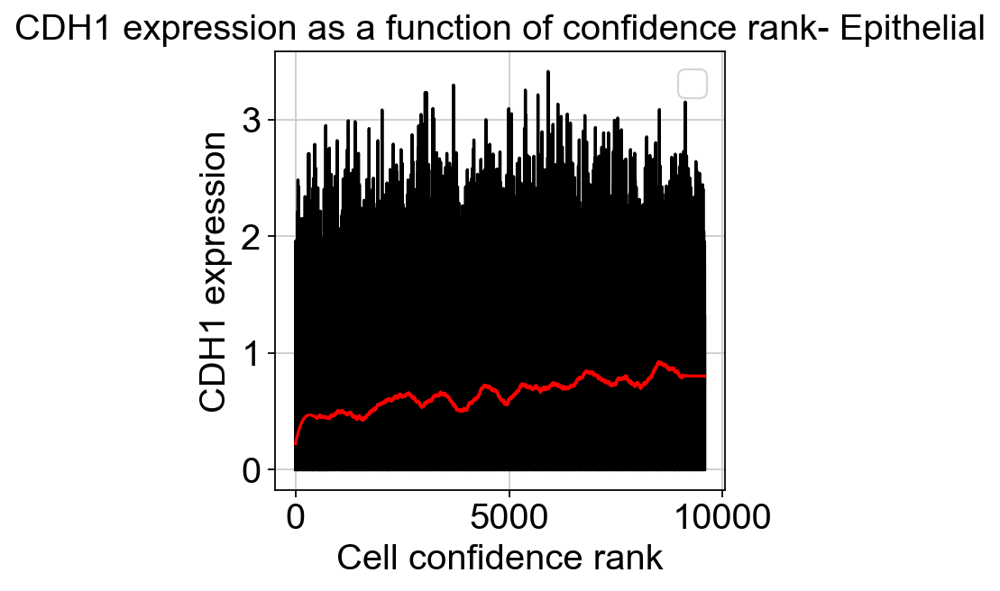

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


SpearmanrResult(correlation=0.14031482186144328, pvalue=2.466791359696165e-43)
CRB3


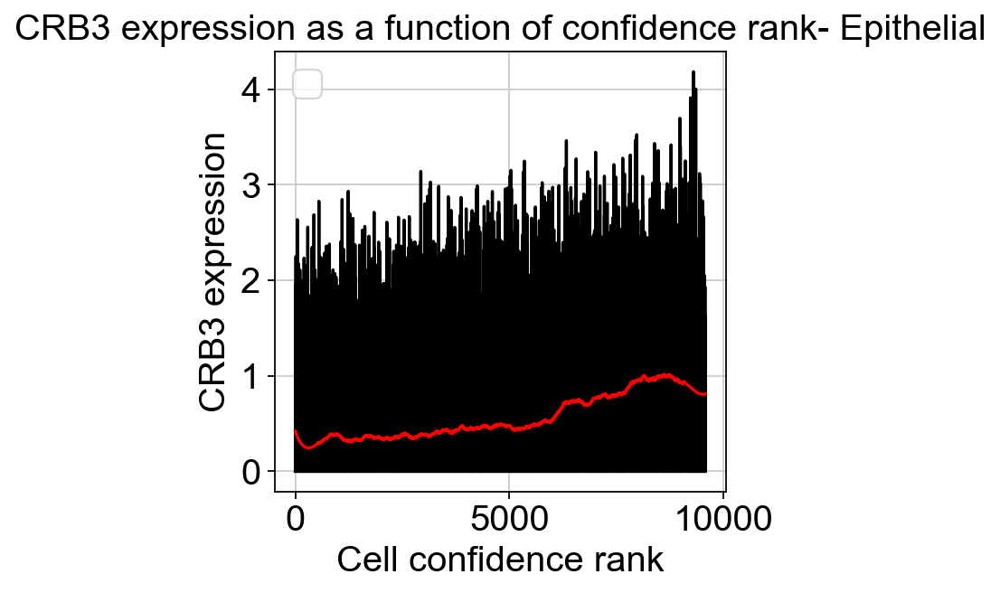

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


SpearmanrResult(correlation=0.24928027721885193, pvalue=1.0953452332655104e-135)
DSP


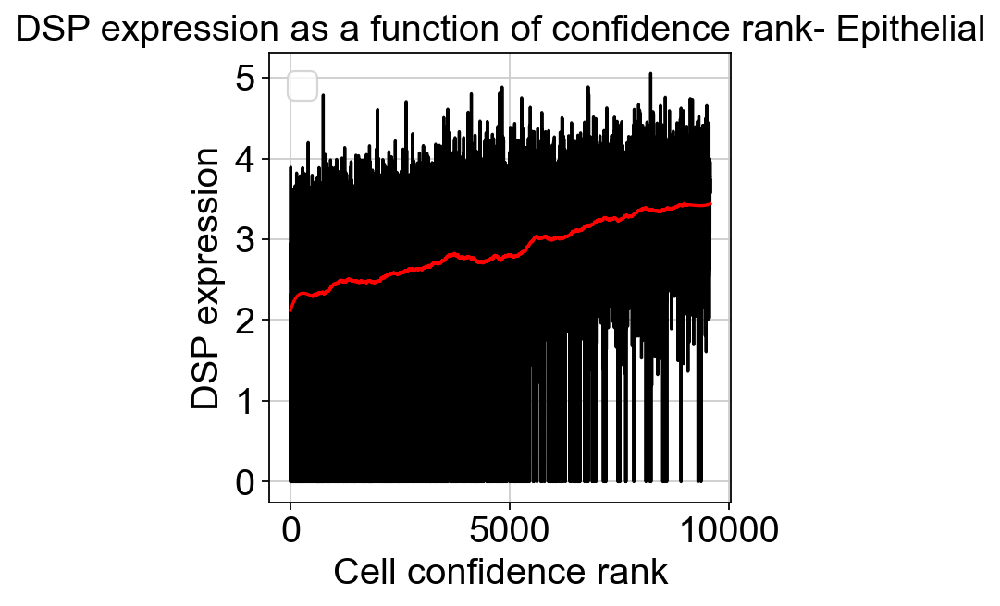

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


SpearmanrResult(correlation=0.4255171449311709, pvalue=0.0)
FN1


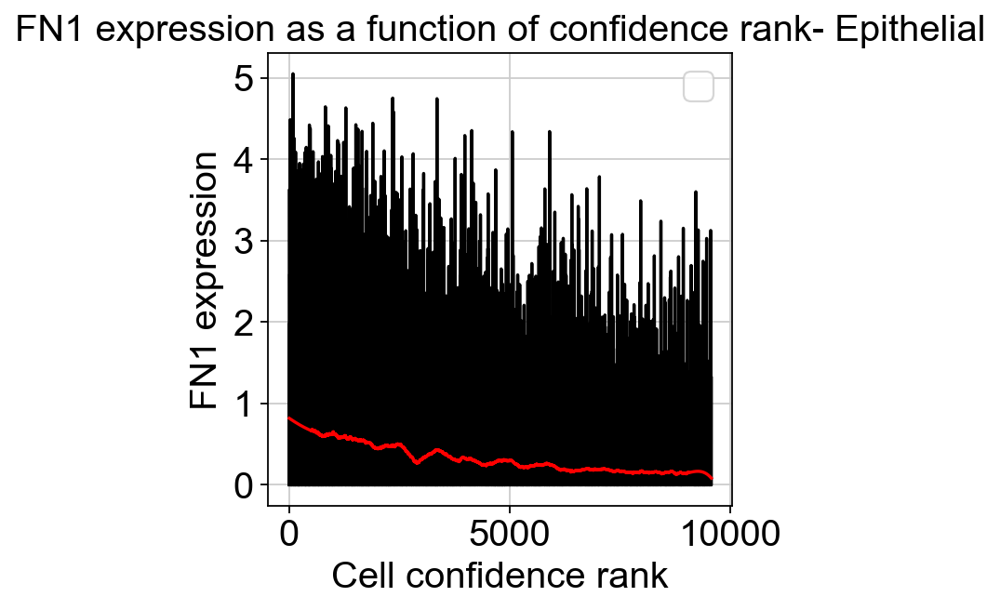

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


SpearmanrResult(correlation=-0.1768372690096095, pvalue=3.6599778719411208e-68)
VIM


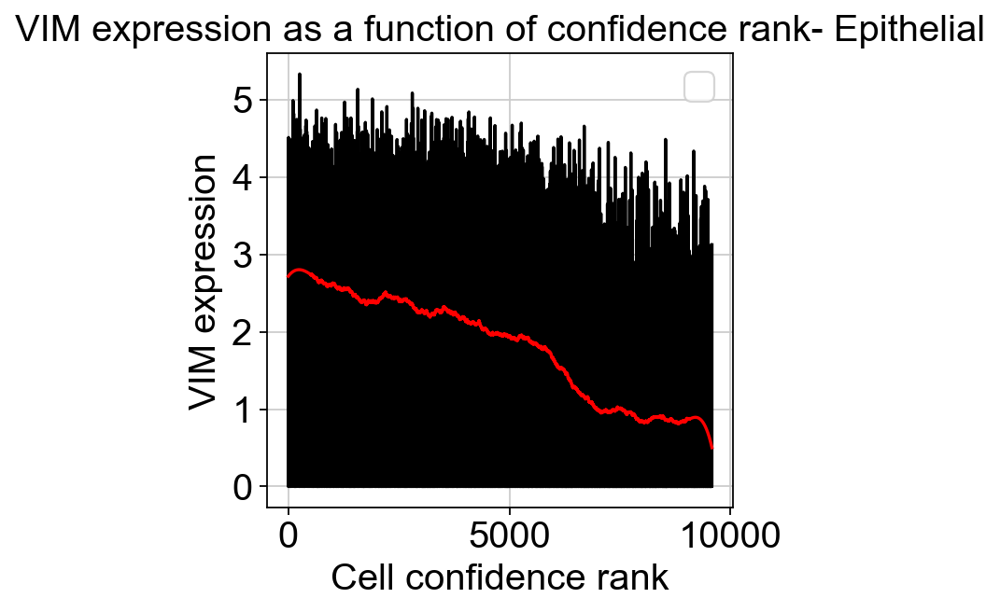

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


SpearmanrResult(correlation=-0.44209943941327434, pvalue=0.0)
CDH2


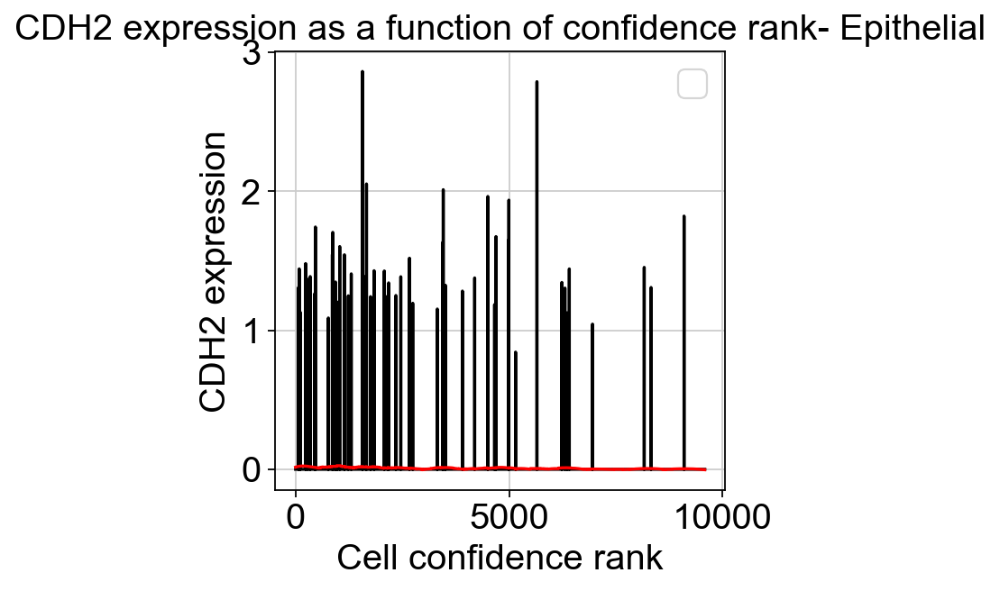

SpearmanrResult(correlation=-0.048110585311720584, pvalue=2.4554570898493904e-06)


In [49]:
from scipy.signal import savgol_filter

for i in marker_gene_list:
    print(i)
    plt.plot( range(adata_epi.n_obs),  adata_epi[arr1_epi,i].X.toarray() , color='black')#, s=0.01 )

    plt.plot( range(adata_epi.n_obs),  savgol_filter(adata_epi[arr1_epi,i].X.toarray()[:,0],1001,3) , color='r')#, s=0.01 )
    plt.xlabel("Cell confidence rank")
    plt.ylabel(str(i) +" expression")
    plt.title(str(i) +" expression as a function of confidence rank- Epithelial")
    plt.legend()
    plt.show()
    print(stats.spearmanr(adata_epi.obs['conf'], adata_epi[:,i].X.toarray()))



In [50]:
adata_epi_humec= adata_epi[adata_epi.obs['cell_line'].isin(['HuMEC'])]
adata_mes_humec= adata_mes[adata_mes.obs['cell_line'].isin(['HuMEC'])]
adata_epi_mcf= adata_epi[adata_epi.obs['cell_line'].isin(['MCF10A'])]
adata_mes_mcf= adata_mes[adata_mes.obs['cell_line'].isin(['MCF10A'])]


In [51]:
adata_epi_humec_graph = adata_epi_humec.copy()
sc.pp.pca(adata_epi_humec)
sc.pp.neighbors(adata_epi_humec)
connectivities_graph , distance_graph  = metrics.make_conf_graph(adata_epi_humec_graph.copy(), alpha=0.3 , k=15)

adata_epi_humec_graph.obsp['connectivities']=sp.csr_matrix(connectivities_graph)

sc.tl.umap(adata_epi_humec_graph)
sc.tl.umap(adata_epi_humec)


In [52]:
adata_epi_mcf_graph = adata_epi_mcf.copy()
sc.pp.pca(adata_epi_mcf)
sc.pp.neighbors(adata_epi_mcf)
connectivities_graph , distance_graph  = metrics.make_conf_graph(adata_epi_mcf_graph.copy(), alpha=0.3 , k=15)

adata_epi_mcf_graph.obsp['connectivities']=sp.csr_matrix(connectivities_graph)

sc.tl.umap(adata_epi_mcf_graph)
sc.tl.umap(adata_epi_mcf)


In [53]:
adata_mes_humec_graph = adata_mes_humec.copy()
sc.pp.pca(adata_mes_humec)
sc.pp.neighbors(adata_mes_humec)
connectivities_graph , distance_graph  = metrics.make_conf_graph(adata_mes_humec_graph.copy(), alpha=0.3 , k=15)

adata_mes_humec_graph.obsp['connectivities']=sp.csr_matrix(connectivities_graph)

sc.tl.umap(adata_mes_humec_graph)
sc.tl.umap(adata_mes_humec)


In [54]:
adata_mes_mcf_graph = adata_mes_mcf.copy()
sc.pp.pca(adata_mes_mcf)
sc.pp.neighbors(adata_mes_mcf)
connectivities_graph , distance_graph  = metrics.make_conf_graph(adata_mes_mcf_graph.copy(), alpha=0.3 , k=15)

adata_mes_mcf_graph.obsp['connectivities']=sp.csr_matrix(connectivities_graph)

sc.tl.umap(adata_mes_mcf_graph)
sc.tl.umap(adata_mes_mcf)


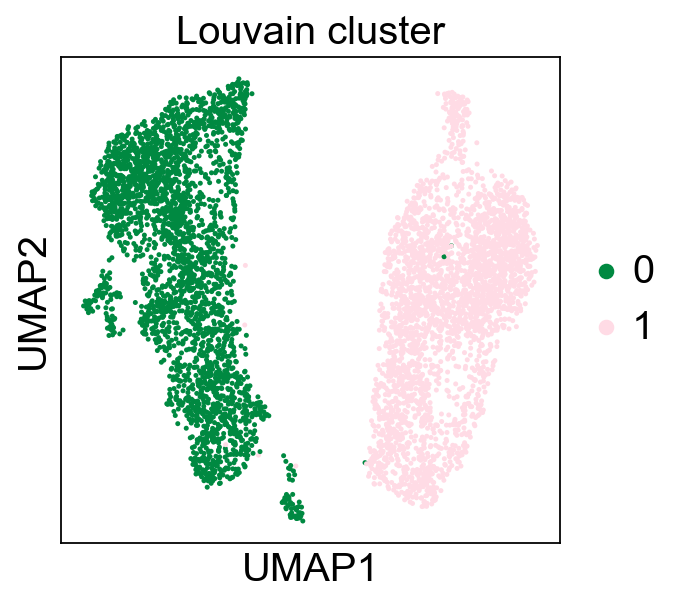

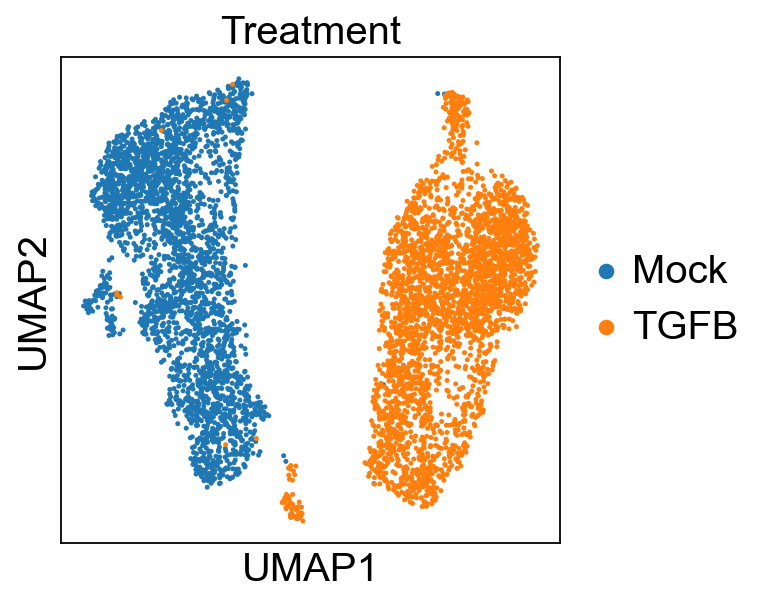

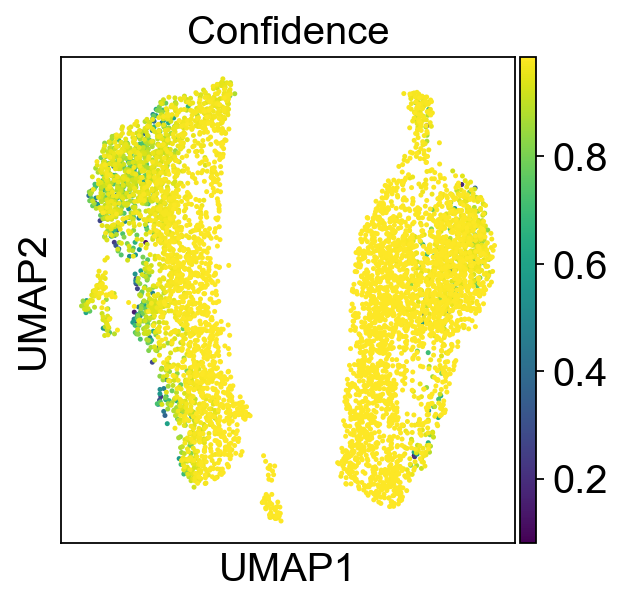

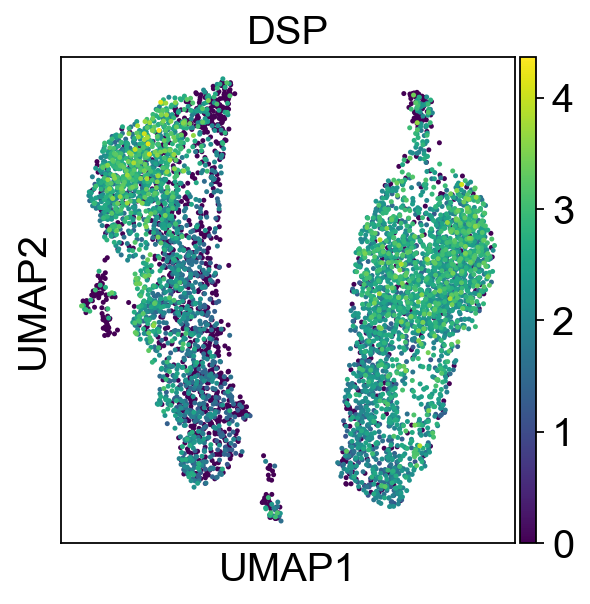

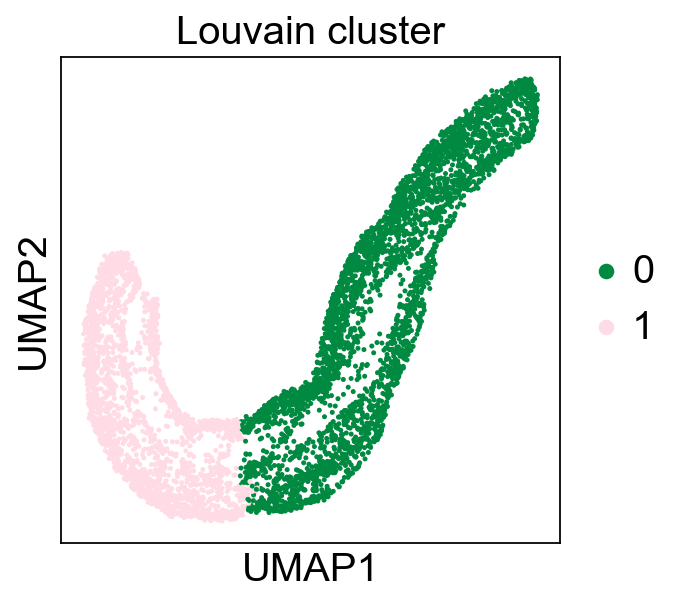

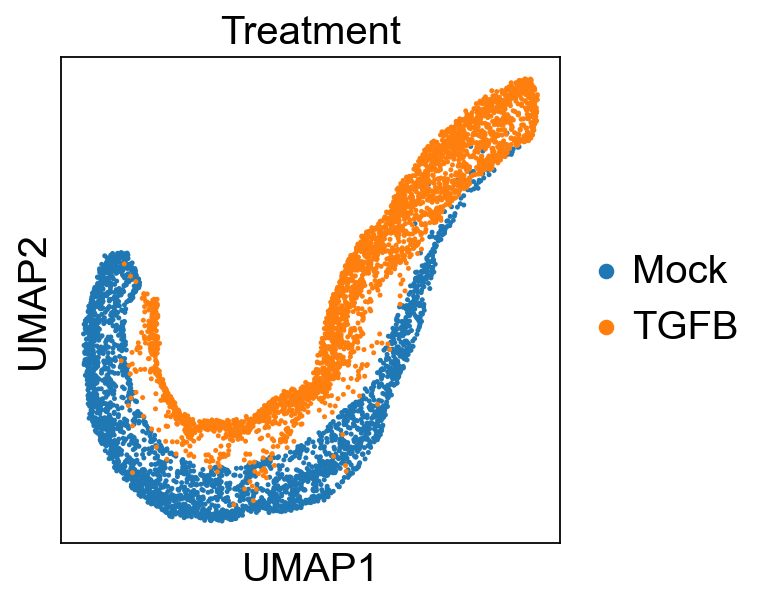

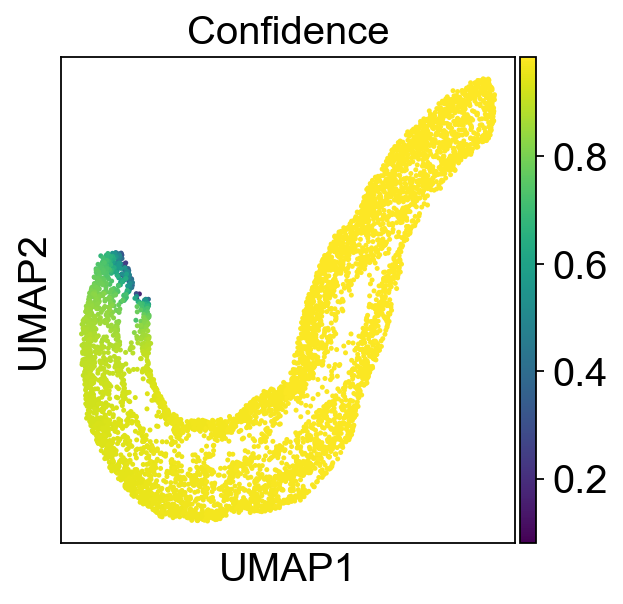

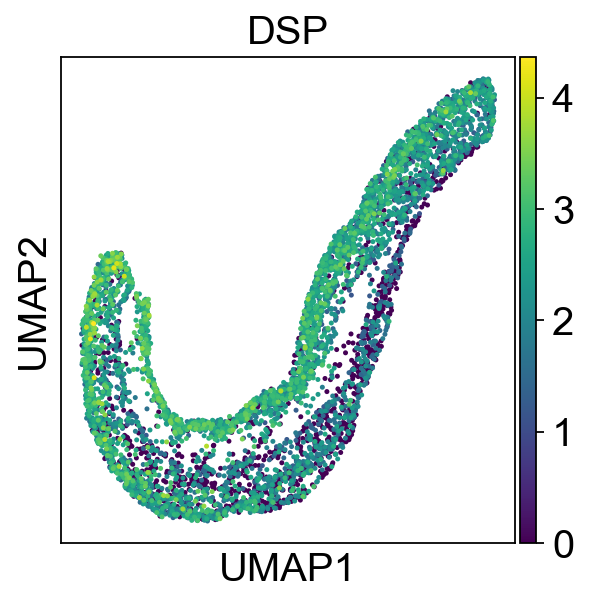

mes


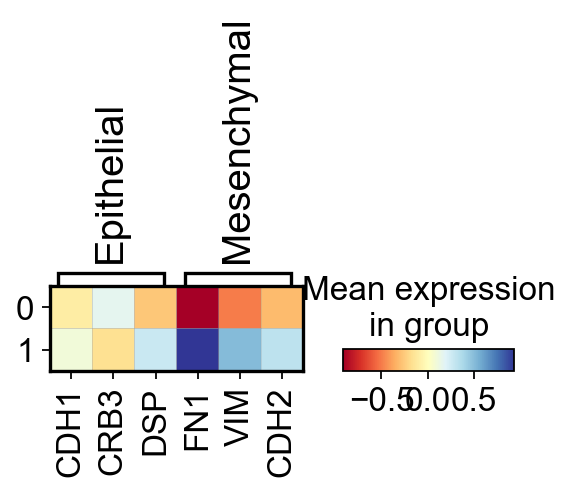

mes graph


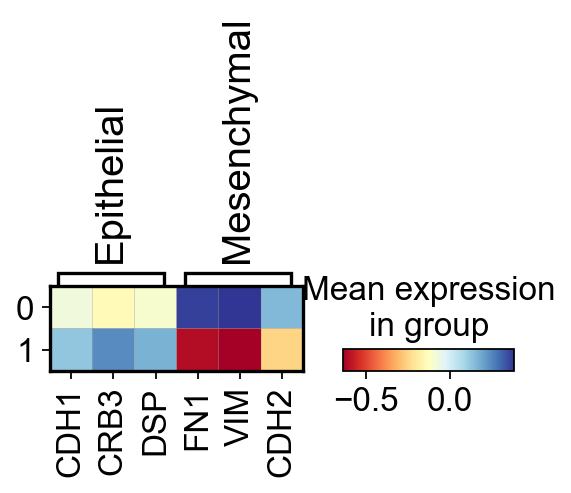

In [55]:
sc.tl.louvain(adata_mes_mcf, resolution=0.01)
sc.tl.louvain(adata_mes_mcf_graph, resolution=0.03)

sc.pl.umap(adata_mes_mcf, color=['louvain'], title='Louvain cluster')
sc.pl.umap(adata_mes_mcf, color=['treatment_id'], title='Treatment')
sc.pl.umap(adata_mes_mcf, color=['conf'], title='Confidence')
sc.pl.umap(adata_mes_mcf, color=['DSP'])


sc.pl.umap(adata_mes_mcf_graph, color=['louvain'], title='Louvain cluster')
sc.pl.umap(adata_mes_mcf_graph, color=['treatment_id'], title='Treatment')
sc.pl.umap(adata_mes_mcf_graph, color=['conf'], title='Confidence')
sc.pl.umap(adata_mes_mcf_graph, color=['DSP'])



adata_mes_mcf_1 =adata_mes_mcf.copy()
sc.pp.scale(adata_mes_mcf_1)
print("mes")
sc.pl.matrixplot(adata_mes_mcf_1,groupby='louvain', var_names= marker_genes_dict,cmap='RdYlBu')
adata_mes_mcf_graph_1 =adata_mes_mcf_graph.copy()
sc.pp.scale(adata_mes_mcf_graph_1)

print("mes graph")

sc.pl.matrixplot(adata_mes_mcf_graph_1,groupby='louvain', var_names= marker_genes_dict,cmap='RdYlBu')


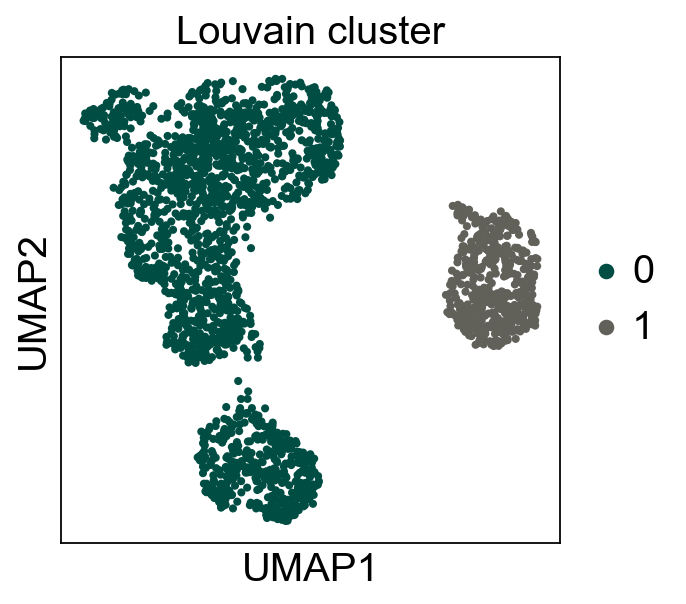

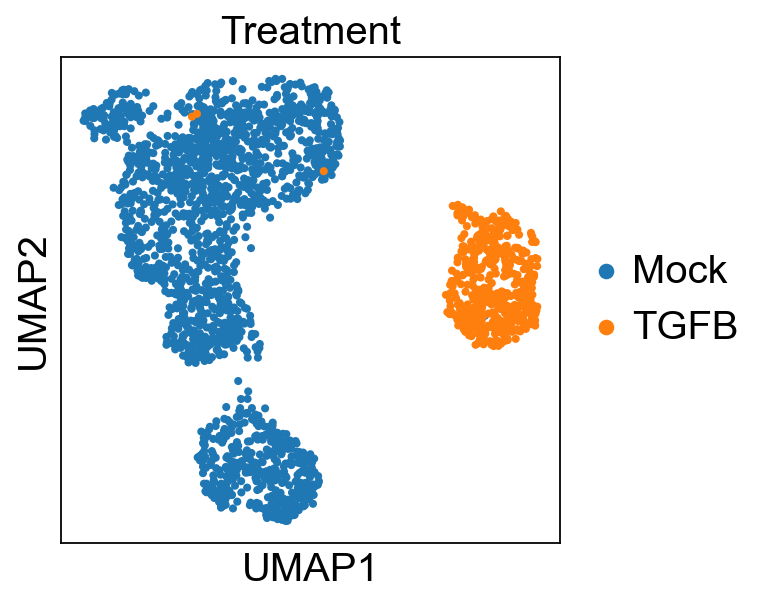

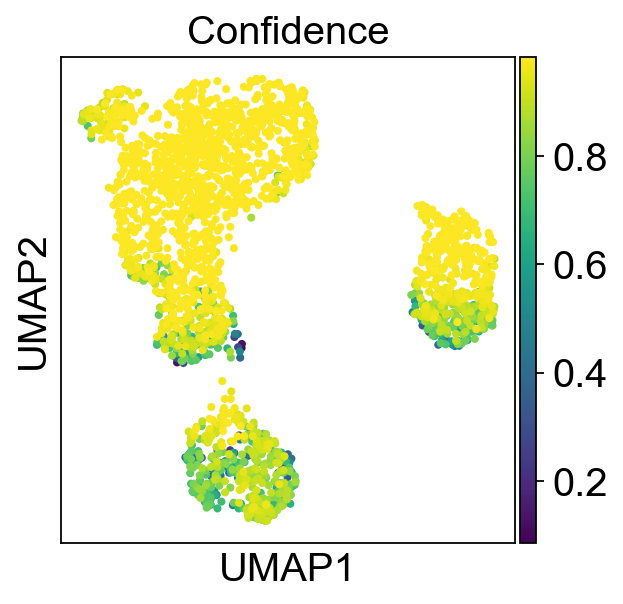

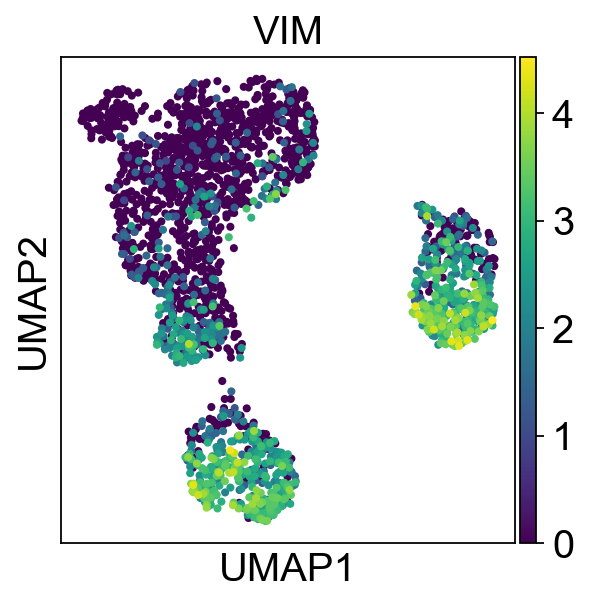

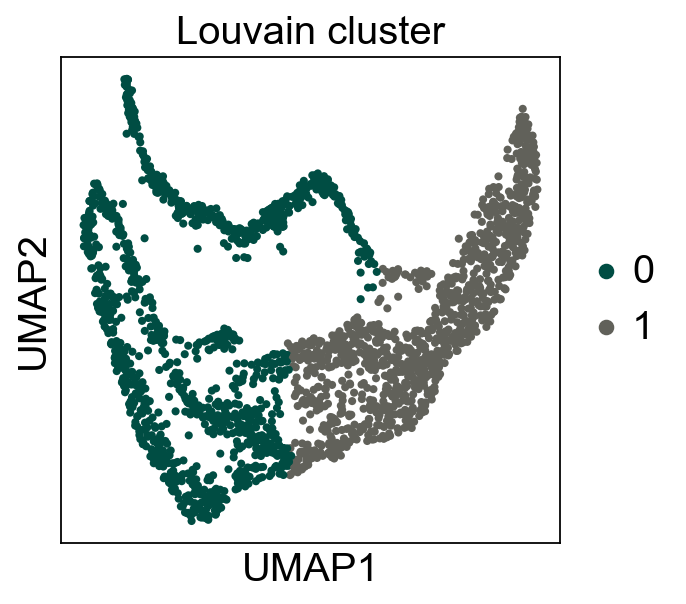

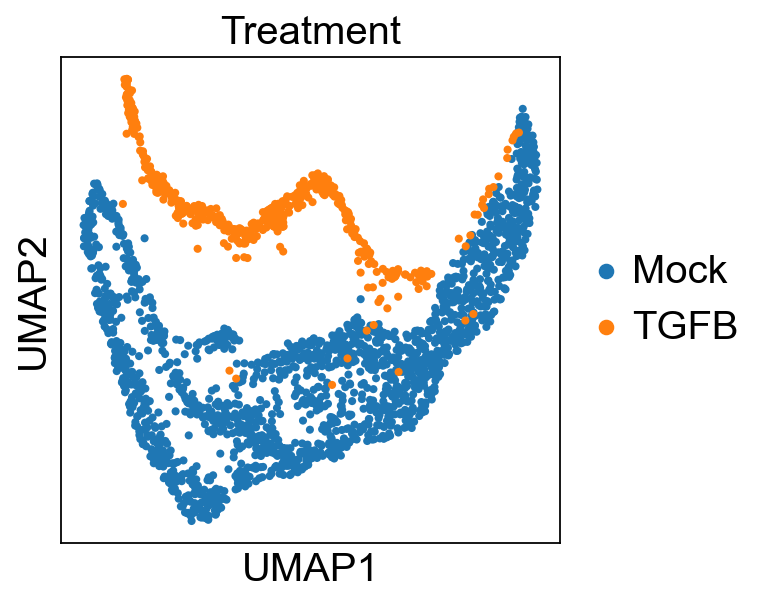

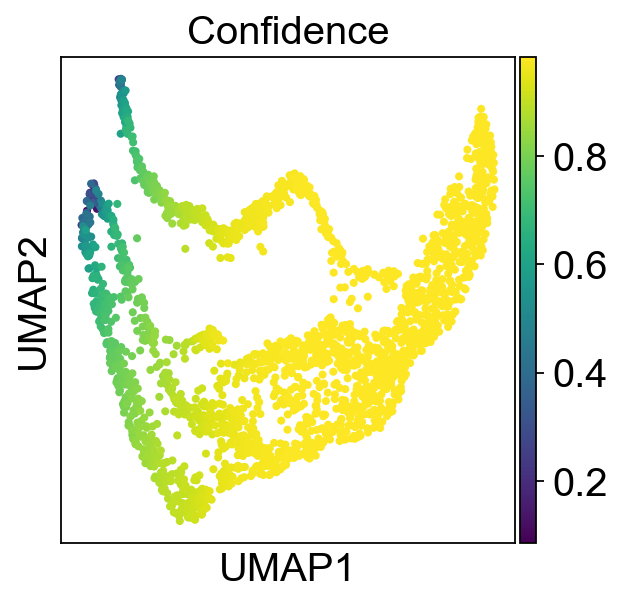

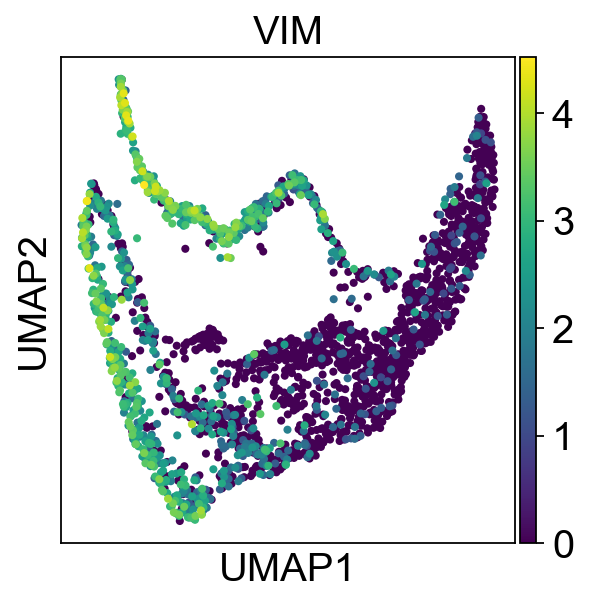

mes


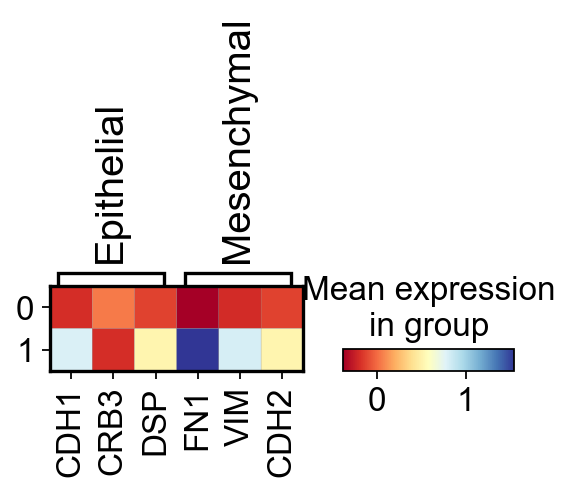

mes graph


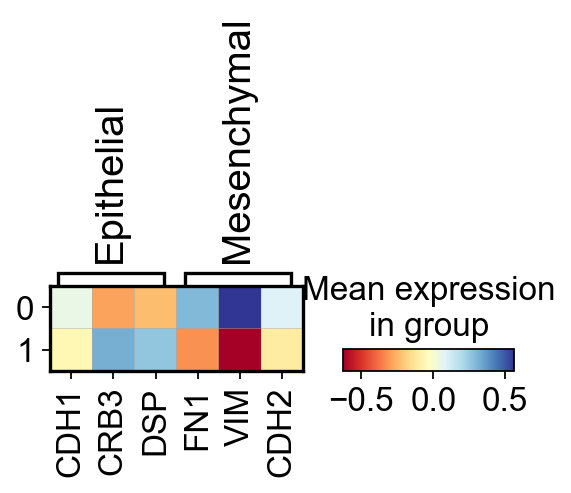

In [65]:
sc.tl.louvain(adata_epi_mcf, resolution=0.01)
sc.tl.louvain(adata_epi_mcf_graph, resolution=0.03)

sc.pl.umap(adata_epi_mcf, color=['louvain'], title='Louvain cluster')
sc.pl.umap(adata_epi_mcf, color=['treatment_id'], title='Treatment')
sc.pl.umap(adata_epi_mcf, color=['conf'], title='Confidence')
sc.pl.umap(adata_epi_mcf, color=['VIM'])


sc.pl.umap(adata_epi_mcf_graph, color=['louvain'], title='Louvain cluster')
sc.pl.umap(adata_epi_mcf_graph, color=['treatment_id'], title='Treatment')
sc.pl.umap(adata_epi_mcf_graph, color=['conf'], title='Confidence')
sc.pl.umap(adata_epi_mcf_graph, color=['VIM'])



adata_epi_mcf_1 =adata_epi_mcf.copy()
sc.pp.scale(adata_epi_mcf_1)
print("mes")
sc.pl.matrixplot(adata_epi_mcf_1,groupby='louvain', var_names= marker_genes_dict,cmap='RdYlBu')
adata_epi_mcf_graph_1 =adata_epi_mcf_graph.copy()
sc.pp.scale(adata_epi_mcf_graph_1)

print("mes graph")

sc.pl.matrixplot(adata_epi_mcf_graph_1,groupby='louvain', var_names= marker_genes_dict,cmap='RdYlBu')


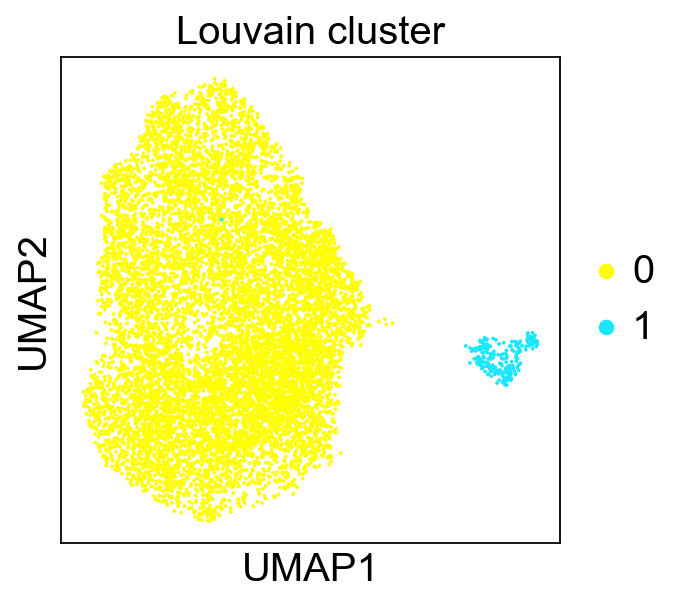

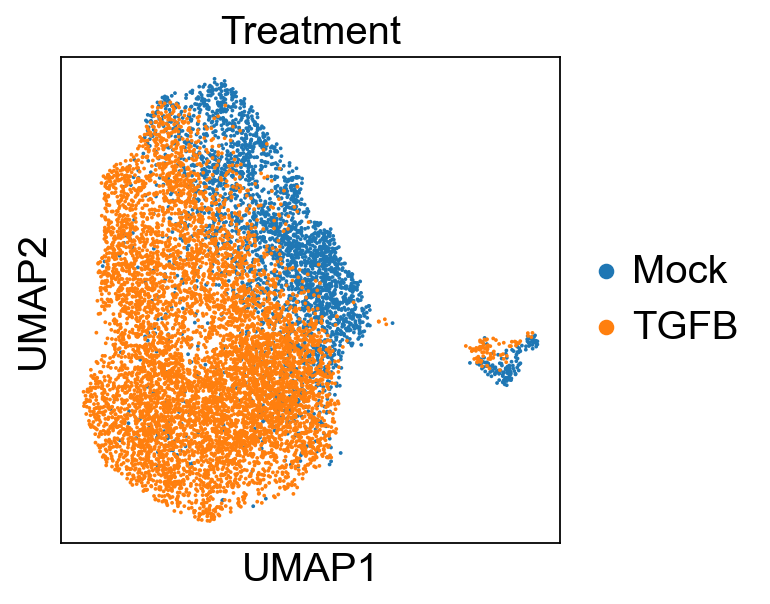

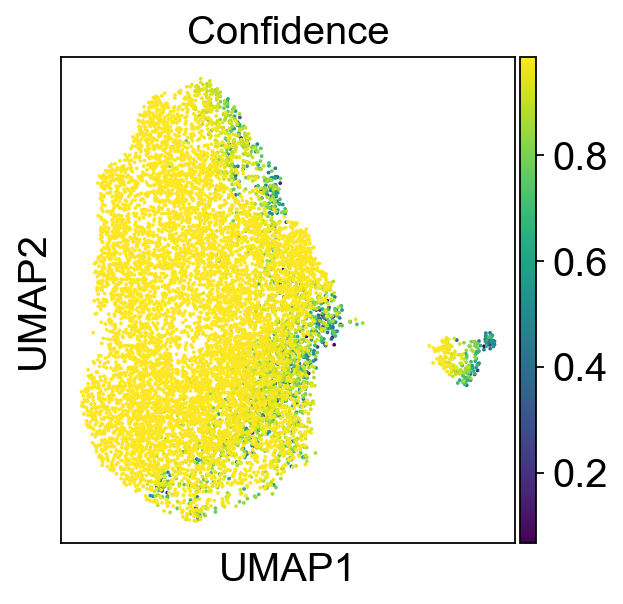

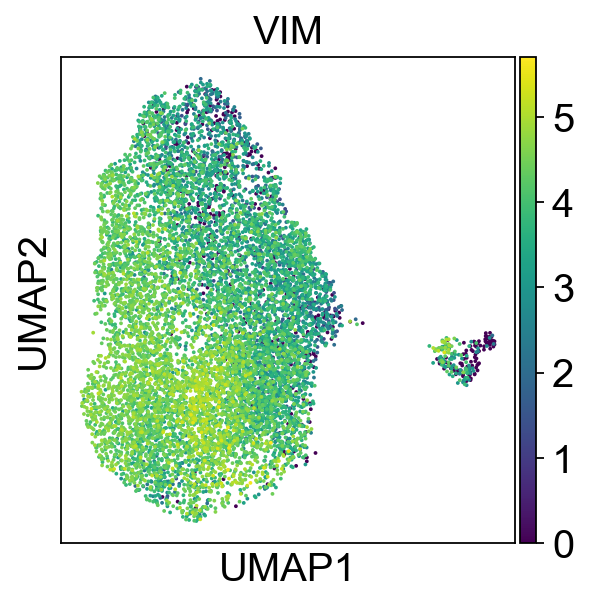

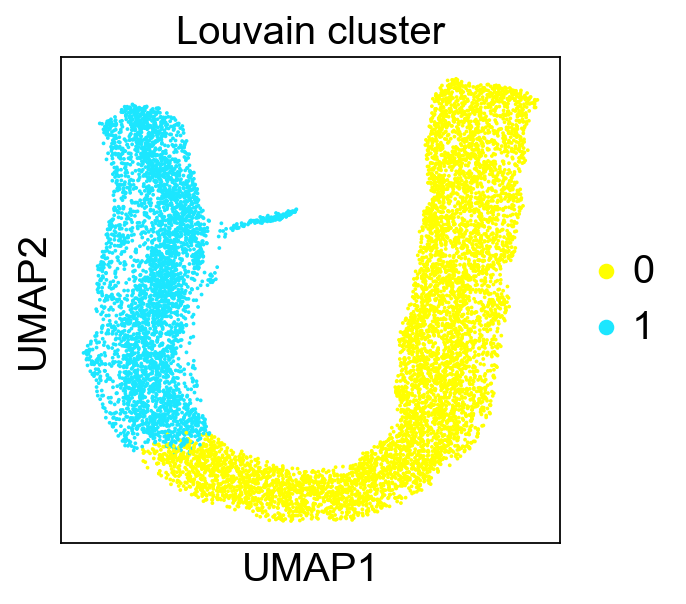

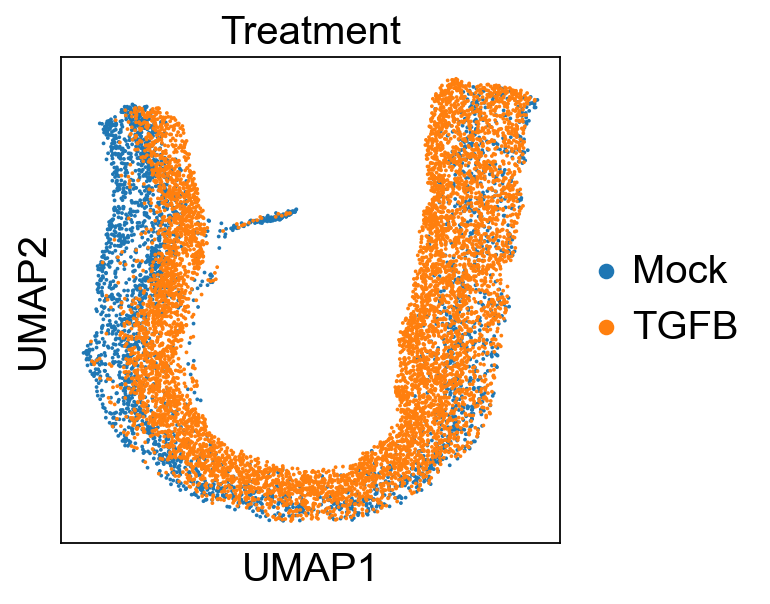

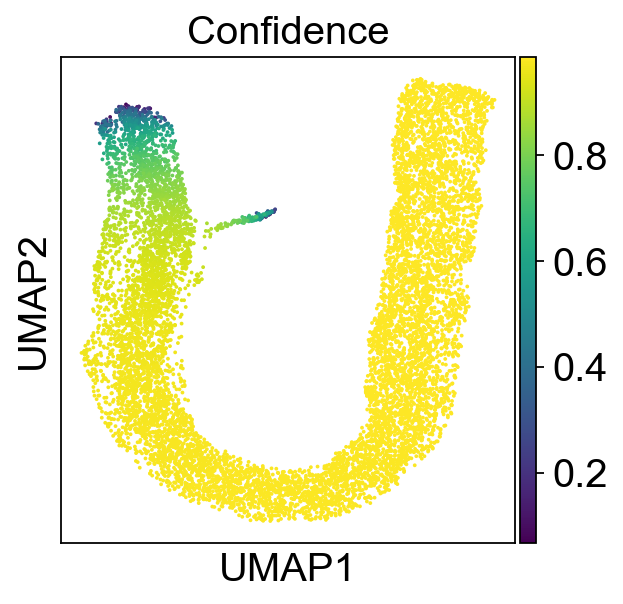

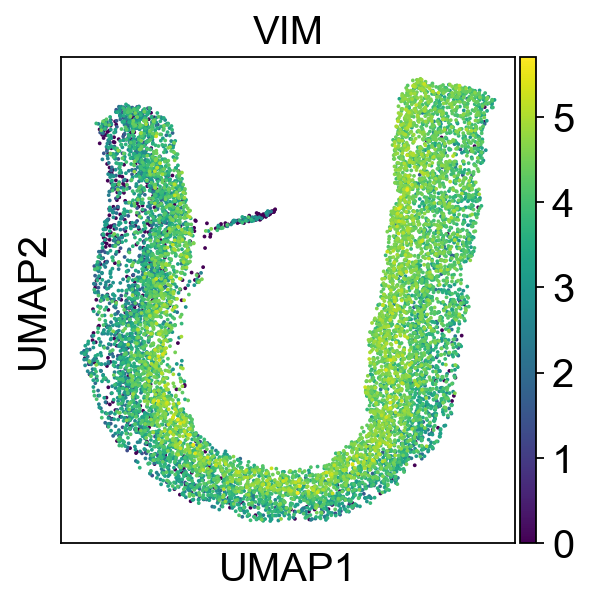

mes


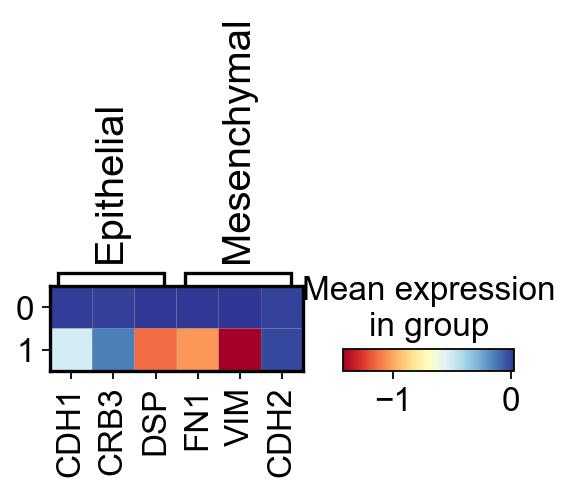

mes graph


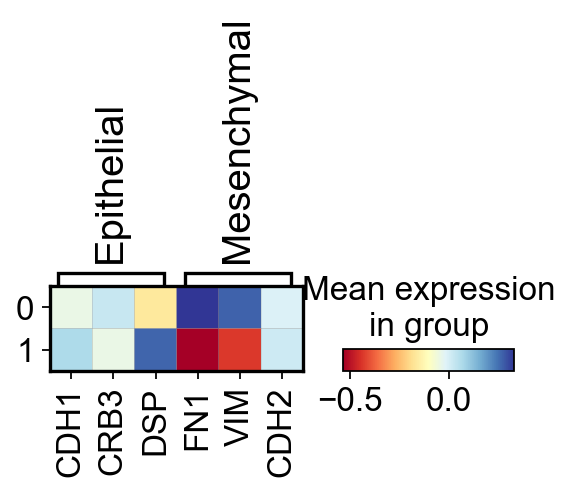

In [57]:
sc.tl.louvain(adata_mes_humec, resolution=0.1)
sc.tl.louvain(adata_mes_humec_graph, resolution=0.03)
sc.pl.umap(adata_mes_humec, color=['louvain'], title='Louvain cluster')
sc.pl.umap(adata_mes_humec, color=['treatment_id'], title='Treatment')
sc.pl.umap(adata_mes_humec, color=['conf'], title='Confidence')
sc.pl.umap(adata_mes_humec, color=['VIM'])


sc.pl.umap(adata_mes_humec_graph, color=['louvain'], title='Louvain cluster')
sc.pl.umap(adata_mes_humec_graph, color=['treatment_id'], title='Treatment')
sc.pl.umap(adata_mes_humec_graph, color=['conf'], title='Confidence')
sc.pl.umap(adata_mes_humec_graph, color=['VIM'])
adata_mes_humec_1 =adata_mes_humec.copy()
sc.pp.scale(adata_mes_humec_1)
print("mes")
sc.pl.matrixplot(adata_mes_humec_1,groupby='louvain', var_names= marker_genes_dict,cmap='RdYlBu')
adata_mes_humec_graph_1 =adata_mes_humec_graph.copy()
sc.pp.scale(adata_mes_humec_graph_1)

print("mes graph")

sc.pl.matrixplot(adata_mes_humec_graph_1,groupby='louvain', var_names= marker_genes_dict,cmap='RdYlBu')


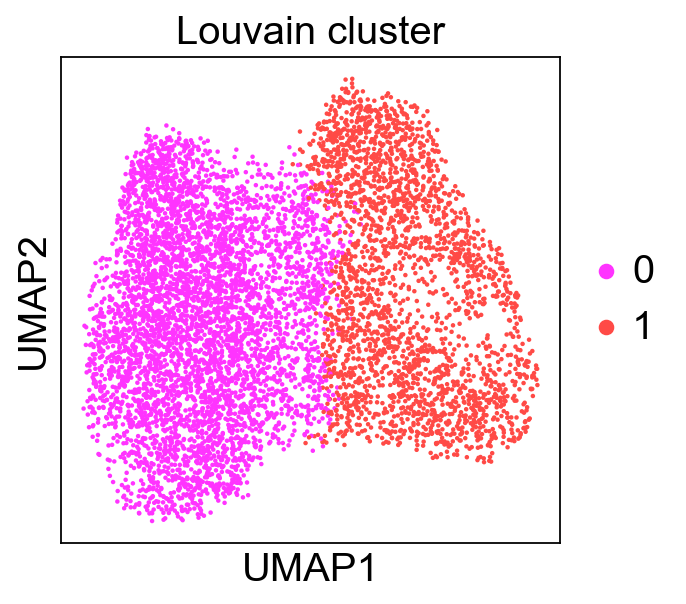

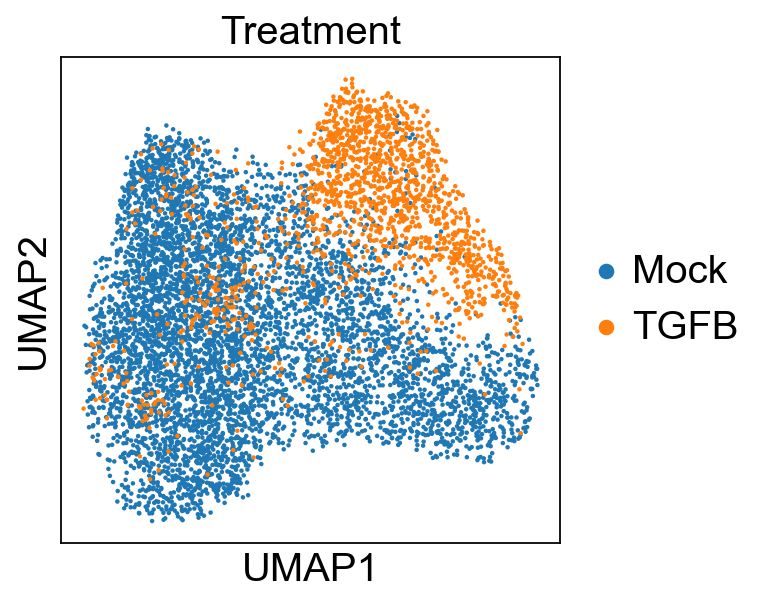

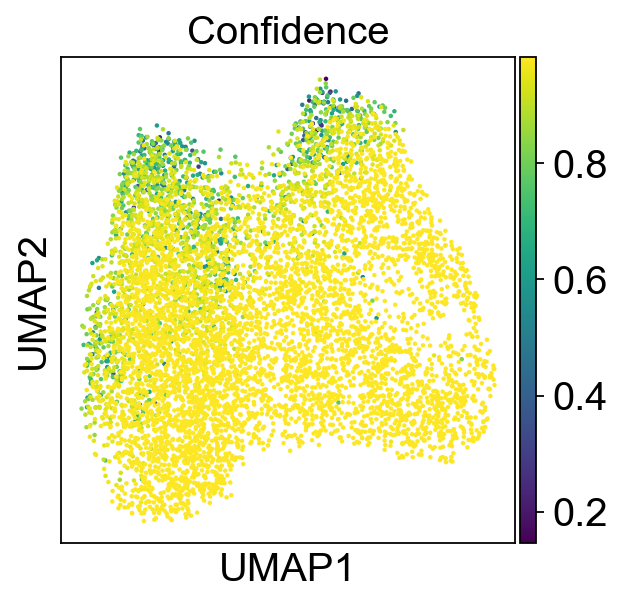

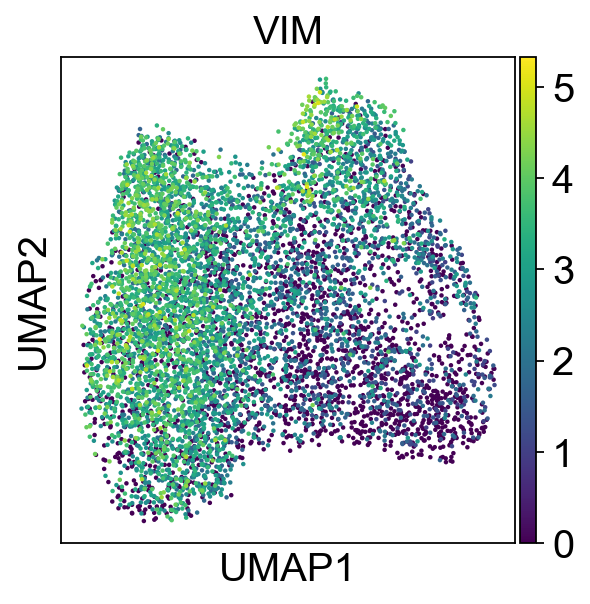

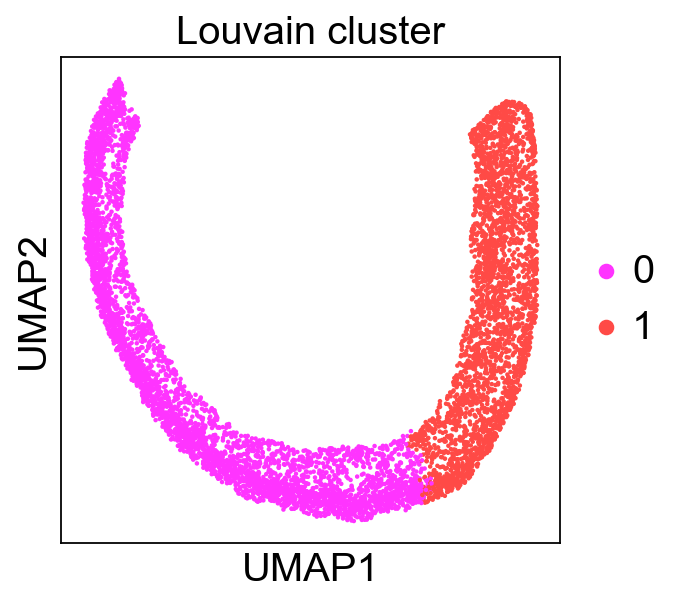

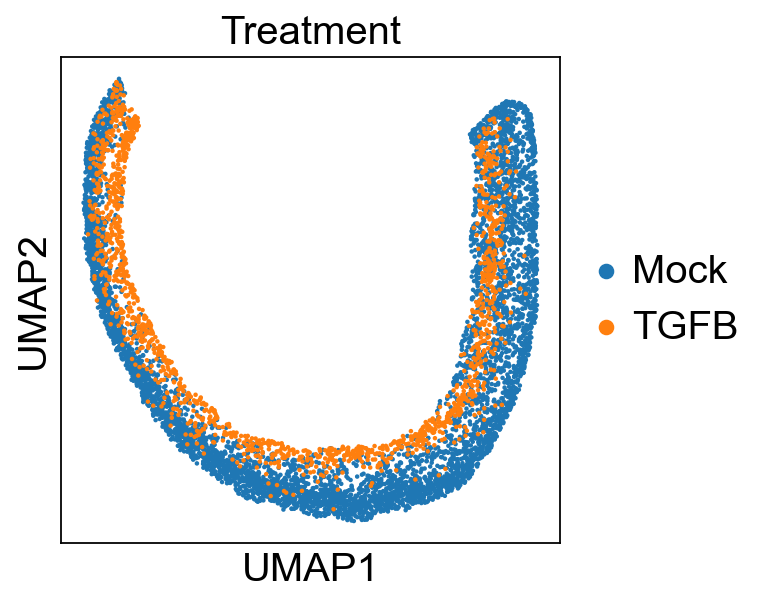

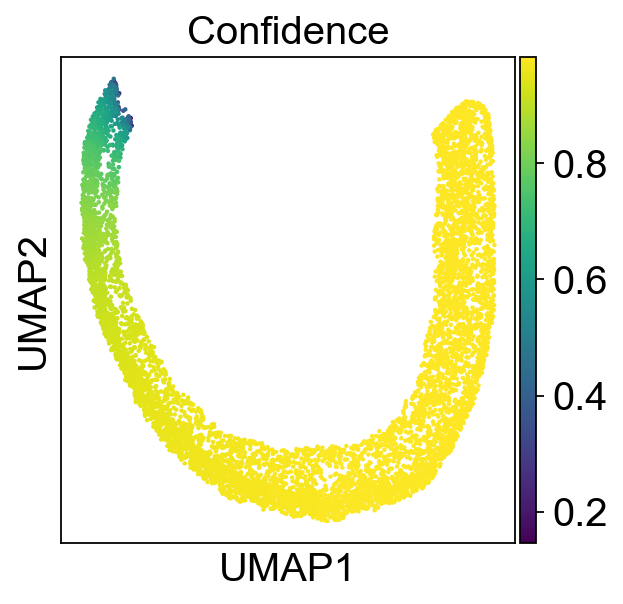

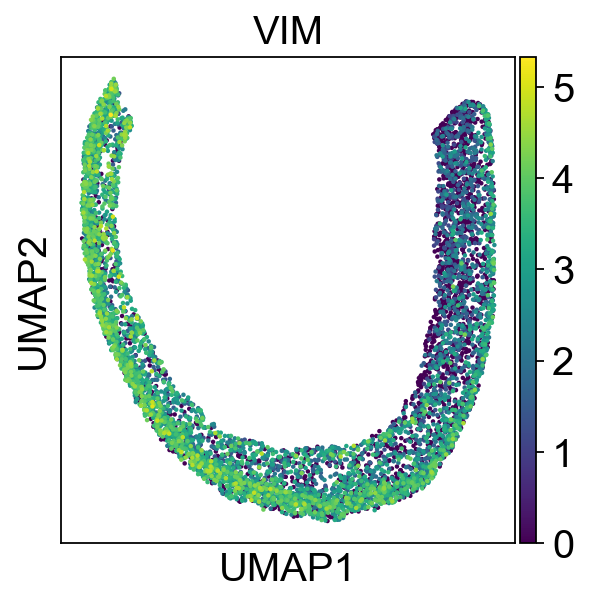

mes


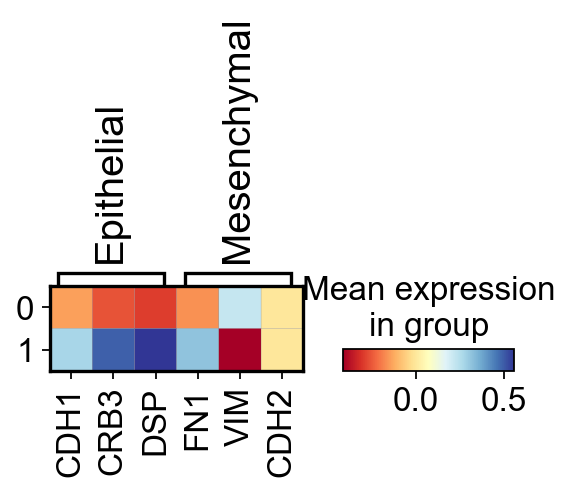

mes graph


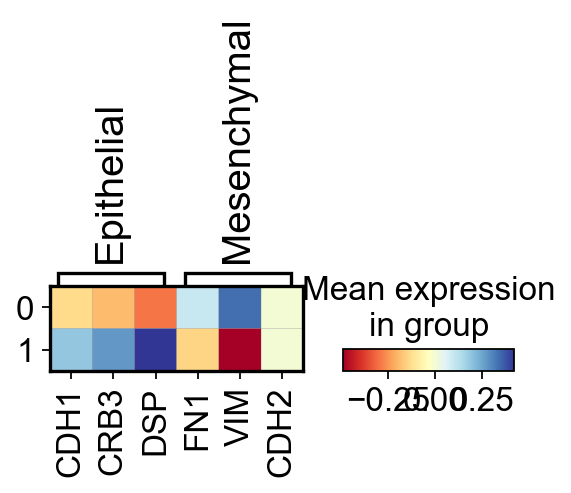

In [58]:
sc.tl.louvain(adata_epi_humec, resolution=0.1)
sc.tl.louvain(adata_epi_humec_graph, resolution=0.03)


sc.pl.umap(adata_epi_humec, color=['louvain'], title='Louvain cluster')
sc.pl.umap(adata_epi_humec, color=['treatment_id'], title='Treatment')
sc.pl.umap(adata_epi_humec, color=['conf'], title='Confidence')
sc.pl.umap(adata_epi_humec, color=['VIM'])


sc.pl.umap(adata_epi_humec_graph, color=['louvain'], title='Louvain cluster')
sc.pl.umap(adata_epi_humec_graph, color=['treatment_id'], title='Treatment')
sc.pl.umap(adata_epi_humec_graph, color=['conf'], title='Confidence')
sc.pl.umap(adata_epi_humec_graph, color=['VIM'])


adata_epi_humec_1 =adata_epi_humec.copy()
sc.pp.scale(adata_epi_humec_1)
print("mes")
sc.pl.matrixplot(adata_epi_humec_1,groupby='louvain', var_names= marker_genes_dict,cmap='RdYlBu')
adata_epi_humec_graph_1 =adata_epi_humec_graph.copy()
sc.pp.scale(adata_epi_humec_graph_1)

print("mes graph")

sc.pl.matrixplot(adata_epi_humec_graph_1,groupby='louvain', var_names= marker_genes_dict, cmap='RdYlBu')



In [59]:

def count_labels(adata,label1, label2):
    lis = adata.obs[label1].values
    lis_set = set(lis)
    for i in lis_set:
        print(i)
        adata_tmp = adata[adata.obs[label1].isin([i])]
        print(adata_tmp.obs[label2].value_counts())


In [60]:
count_labels(adata_epi_humec,label1='louvain',label2='treatment_id')
print("graph")
count_labels(adata_epi_humec_graph,label1='louvain',label2='treatment_id')


0
Mock    4438
TGFB     358
Name: treatment_id, dtype: int64
1
Mock    1311
TGFB    1215
Name: treatment_id, dtype: int64
graph
0
Mock    3271
TGFB    1044
Name: treatment_id, dtype: int64
1
Mock    2478
TGFB     529
Name: treatment_id, dtype: int64


In [61]:
count_labels(adata_epi_mcf,label1='louvain',label2='treatment_id')
print("graph")
count_labels(adata_epi_mcf_graph,label1='louvain',label2='treatment_id')


0
Mock    1813
TGFB       3
Name: treatment_id, dtype: int64
1
TGFB    444
Mock      1
Name: treatment_id, dtype: int64
graph
0
Mock    1015
TGFB      56
Name: treatment_id, dtype: int64
1
Mock    798
TGFB      3
Name: treatment_id, dtype: int64
2
TGFB    388
Mock      1
Name: treatment_id, dtype: int64


In [62]:
count_labels(adata_mes_mcf,label1='louvain',label2='treatment_id')
print("graph")
count_labels(adata_mes_mcf_graph,label1='louvain',label2='treatment_id')


0
Mock    2930
TGFB      60
Name: treatment_id, dtype: int64
1
TGFB    2914
Mock       8
Name: treatment_id, dtype: int64
graph
0
TGFB    2510
Mock    1175
Name: treatment_id, dtype: int64
1
Mock    1763
TGFB     464
Name: treatment_id, dtype: int64


In [63]:
count_labels(adata_mes_humec,label1='louvain',label2='treatment_id')
print("graph")
count_labels(adata_mes_humec_graph,label1='louvain',label2='treatment_id')


0
TGFB    7085
Mock    2987
Name: treatment_id, dtype: int64
1
Mock    146
TGFB     77
Name: treatment_id, dtype: int64
graph
0
TGFB    4978
Mock    1376
Name: treatment_id, dtype: int64
1
TGFB    2184
Mock    1757
Name: treatment_id, dtype: int64


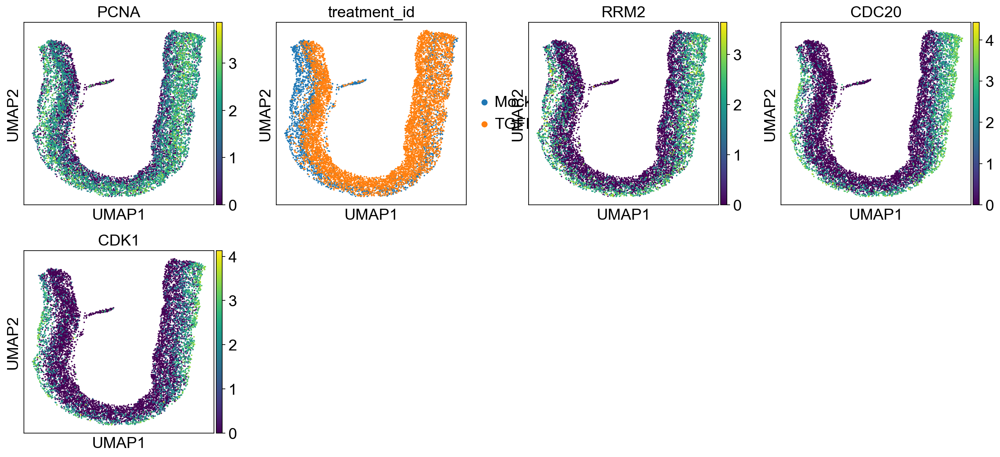

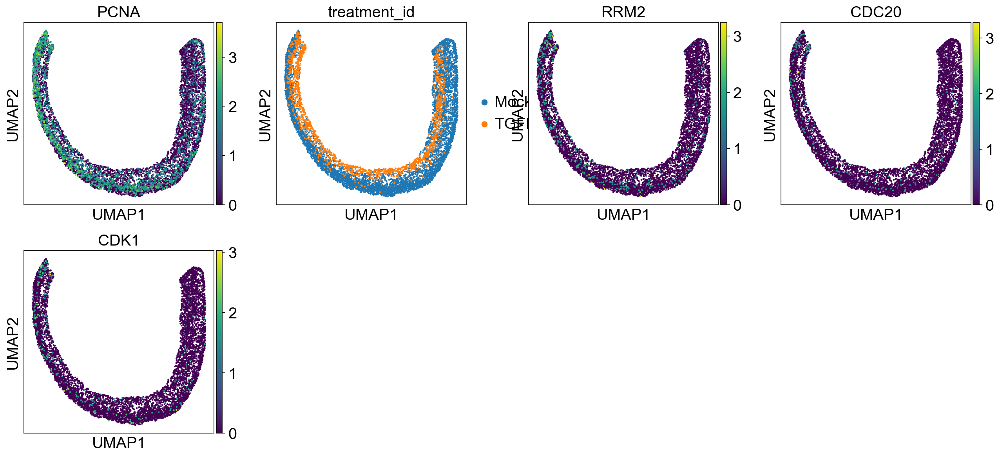

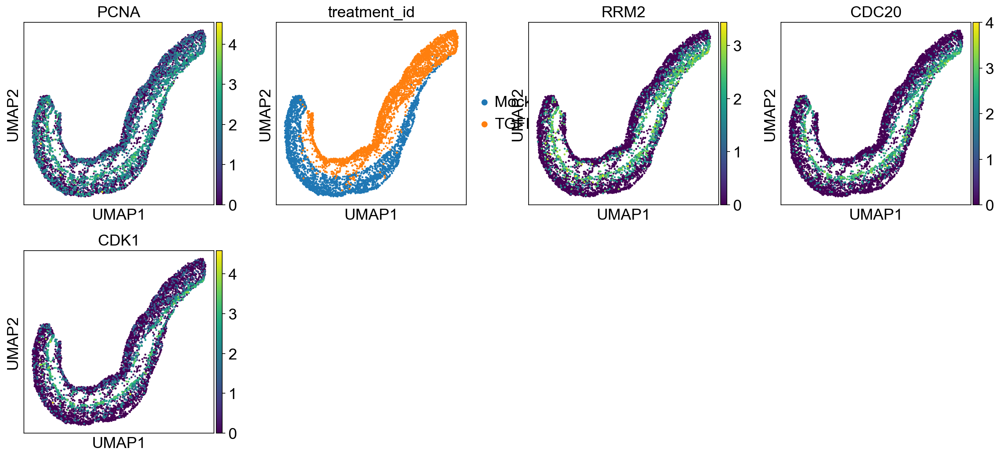

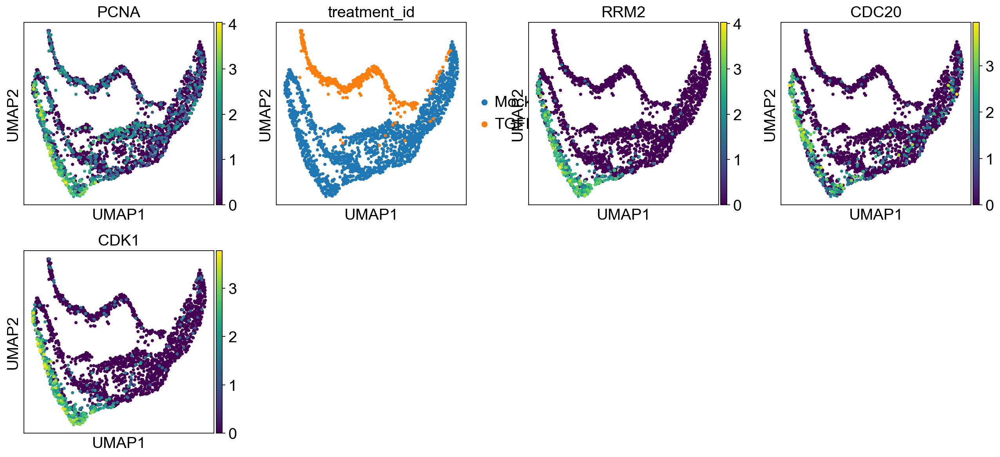

In [64]:
sc.pl.umap(adata_mes_humec_graph, color=['PCNA','treatment_id','RRM2','CDC20','CDK1'])
sc.pl.umap(adata_epi_humec_graph, color=['PCNA','treatment_id','RRM2','CDC20','CDK1'])
sc.pl.umap(adata_mes_mcf_graph, color=['PCNA','treatment_id','RRM2','CDC20','CDK1'])
sc.pl.umap(adata_epi_mcf_graph, color=['PCNA','treatment_id','RRM2','CDC20','CDK1'])